In [1]:
# you don't really care about this code
# these are just basic module imports

import sys
import os
from pathlib import Path
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'

sys.path.append(os.path.abspath("../src"))
# We change the working directory to the root of the project
# Run this only once
root_path = Path.cwd().parent
os.chdir(root_path)
sys.path.append(root_path / "src")

In [2]:
from notebook_utils.parquet_utils import load_dataframe
from src.patch_processing.svg import SVG

/home/mathis/anaconda3/envs/projetOCR/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
representatives_df = load_dataframe('outputs/clustering/book1/label_representatives')
filtered_df = load_dataframe('outputs/clustering/book1/filtered_patches')

Loading column: bin_patch
Loading column: img_patch
Loading column: page
Loading column: file
Loading column: left
Loading column: top
Loading column: width
Loading column: height
Loading column: label
Loading column: page_skew
Loading column: reading_order
Loading column: svg
Loading column: unc_qwen
Loading column: char_qwen
Loading column: histogram
Loading column: membership
Loading column: degree_centrality
Loading column: best_hog_config
Loading column: best_cell_size
Loading column: best_grdt_sigma
Loading column: best_num_bins
✓ Loaded from outputs/clustering/book1/label_representatives
Loading column: bin_patch
Loading column: img_patch
Loading column: page
Loading column: file
Loading column: left
Loading column: top
Loading column: width
Loading column: height
Loading column: label
Loading column: page_skew
Loading column: reading_order
Loading column: svg
Loading column: unc_qwen
Loading column: char_qwen
Loading column: histogram
Loading column: membership
Loading column: 

In [4]:
from src.registration.multiscale_registration import MultiscaleIC

# Create the single scale IC component first
from src.registration.single_scale import InverseCompositional
from src.registration.gradients import Gradients

# Create gradient method
# you can leave it like this
gradient_method = Gradients(
    method='farid5',
    C=1,
    device=device
)

# Create single scale IC
single_scale_ic = InverseCompositional(
    transform_type='homography',        # 'translation', 'euclidean', 'similarity', 'affinity' or 'homography'
    gradient_method=gradient_method,
    error_function='l2',                # 'l2', 'lorentzian', 'geman_mcclure', 'charbonnier'. The first paper uses l2. Lorentzian is better
    delta=5,                            # you can leave it like this
    epsilon=1e-3,                       # convergence threshold
    max_iter=120,                       # max number of iterations
    #lambda_init=80.0,                   # not used if you use l2 error_function
    #lambda_min=5.0,                     # same
    #lambda_decay=0.9                    # same
)



In [5]:
import torch
from tqdm import tqdm
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def render_df_to_binary_torch(svg_series, output_size=(256, 256)):
    """
    Render all SVGs in a dataframe column into a single binarized PyTorch tensor.
    Output shape: (B, 1, H, W) with values 0 (background) or 1 (inside glyph).
    """
    tensors = []
    for svg_obj in tqdm(svg_series):
        img_np = svg_obj.render(
            output_size=output_size,
            output_format='L',
            respect_aspect_ratio=False
        )
        # Binarize: 1 inside glyph, 0 outside
        img_bin = (img_np == 0).astype("float32")
        # Add channel dimension only
        tensor = torch.tensor(img_bin).unsqueeze(0).to(device)  # (1,H,W)
        tensors.append(tensor)
    # Stack into batch
    return torch.stack(tensors, dim=0)  # (B,1,H,W)



In [8]:
# Render all filtered glyphs
filtered_tensors = render_df_to_binary_torch(filtered_df['svg'])

# Render all representative glyphs
rep_tensors = render_df_to_binary_torch(representatives_df['svg'])


100%|██████████| 12622/12622 [01:36<00:00, 130.91it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 3.08 GiB. GPU 0 has a total capacity of 3.94 GiB of which 829.69 MiB is free. Including non-PyTorch memory, this process has 3.12 GiB memory in use. Of the allocated memory 3.08 GiB is allocated by PyTorch, and 510.00 KiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

### Stage 1: Computing MSE matrix by vectorization

Instead of computing MSE pair-by-pair, we streamline the computational process by using vectorization. Considering <br>
For two vectors $a,b \in \mathbb{R}^{D}$:
$$MSE(a,b) = \frac{1}{D}\sum_{k=1}^{D}(a_{k}-b_{k})^{2}$$
Expanding:
$$=\frac{1}{D}(\left \| a \right \| ^{2}+\left \| b \right \| ^{2}-2a\cdot b)$$

In [6]:
from src.patch_processing.hog import HOG
from src.patch_processing.renderer import Renderer
from src.patch_processing.params import HOGParameters
from src.clustering.feature_matching import featureMatching
from src.clustering.params import featureMatchingParameters


filterered_renderer = Renderer(
    scale=1.0,
    dpi=256,
    bin_thresh=0.5,
    pad_to_multiple=24,
    svg_imgs=filtered_df['svg']
)


representatives_renderer = Renderer(
    scale=1.0,
    dpi=256,
    bin_thresh=0.5,
    pad_to_multiple=24,
    svg_imgs=representatives_df['svg']
)


representatives_renderer.canvas_dims = filterered_renderer.canvas_dims
representatives_renderer.barycenters = filterered_renderer.barycenters

hogParams = HOGParameters(
    cell_height=24,
    cell_width=24,
    num_bins=8
)

hog = HOG(hogParams)


fMParams = featureMatchingParameters(metric="L2")
featureMatcher = featureMatching(fMParams)

Rendering: 100%|██████████| 1216/1216 [00:03<00:00, 320.76img/s]


In [7]:
from torch.utils.data import DataLoader


def compute_hog(hog, hog_renderer):

    hog_device = hog._params.device

    dataloader = DataLoader(
        hog_renderer,
        batch_size=256,
        shuffle=False,
        num_workers=0,
        pin_memory=True
    )

    # - Preallocate the histograms -
    first_batch = next(iter(dataloader))
    sample_output = hog(first_batch[:1].unsqueeze(1).to(dtype=torch.float32, device=hog_device))


    total_samples = len(hog_renderer)
    histogram_shape = sample_output[0, 0].shape

    histograms = torch.zeros((total_samples, *histogram_shape), device=hog_device)
    
    # - loop on the dataset -
    dataloader = tqdm(dataloader, desc="Computing the HOG", colour="red")

    start_idx = 0
    for batch in dataloader:
        hogOutput = hog(batch.unsqueeze(1).to(dtype=torch.float32, device=hog_device))
        histogram_batch = hogOutput[:, 0]
        
        batch_size = histogram_batch.shape[0]
        histograms[start_idx:start_idx + batch_size] = histogram_batch
        start_idx += batch_size

    return histograms



histograms_repr = compute_hog(hog, hog_renderer=representatives_renderer)
histograms_filt = compute_hog(hog, hog_renderer=filterered_renderer)
histograms_repr.shape, histograms_filt.shape

Computing the HOG: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


(torch.Size([1216, 56, 8]), torch.Size([12622, 56, 8]))

In [ ]:
fMParams = featureMatchingParameters(metric="L2", partial_output=False)

featureMatcher = featureMatching(fMParams)

_, nlfa, dissim = featureMatcher.match(query_histograms=histograms_filt, key_histograms=histograms_repr)

Batch size :  110


100%|██████████| 115/115 [00:02<00:00, 39.84it/s]


In [ ]:
torch.save(nlfa, 'nlfa.pt')

NLFA is low for dissimilar images / high for similar ones

MSE => High for dissimilar images / low for similar
-NLFA => High for dissimlar / low for similar

#### Stage 1 statistic:

In [ ]:
import torch
import numpy as np
import os
from tqdm import tqdm

# Setup
save_dir = "two_stage_mse_results"
os.makedirs(save_dir, exist_ok=True)

Nf, _, H, W = filtered_tensors.shape
Nr = rep_tensors.shape[0]

print(f"=== Dataset Information ===")
print(f"Filtered images: {Nf:,}")
print(f"Representatives: {Nr:,}")
print(f"Image size: {H}x{W} = {H*W:,} pixels")
print(f"Save directory: {save_dir}")

def compute_mse_without_registration():
    """
    Stage 1: Compute MSE matrix WITHOUT registration.
    Just pixel-wise comparison between original images.
    
    Uses: MSE = 1/(H*W) * Σ (filtered[i] - rep[j])²
    Computed efficiently using: ||f||² + ||r||² - 2f·r
    """
    print("\n=== STAGE 1: Computing MSE without Registration ===")
    print("(Simple pixel-wise comparison of original images)")
    
    # Move all tensors to CPU for fast computation
    print("1. Moving tensors to CPU...")
    filtered_cpu = filtered_tensors.cpu().float()  # (Nf, 1, H, W)
    reps_cpu = rep_tensors.cpu().float()          # (Nr, 1, H, W)
    
    # Flatten images for efficient computation
    print("2. Flattening images...")
    filtered_flat = filtered_cpu.view(Nf, -1)  # (Nf, D) where D = H*W
    reps_flat = reps_cpu.view(Nr, -1)         # (Nr, D)
    
    # Compute norms for efficient MSE computation
    print("3. Computing norms...")
    # ||filtered_i||² for all i
    filtered_norms = (filtered_flat ** 2).sum(dim=1, keepdim=True)  # (Nf, 1)
    # ||rep_j||² for all j  
    reps_norms = (reps_flat ** 2).sum(dim=1)  # (Nr,)
    
    # Compute dot products in batches to avoid memory issues
    batch_size = 5000  # Adjust based on your RAM
    mse_matrix_stage1 = torch.zeros((Nf, Nr), dtype=torch.float32)
    
    print(f"\n4. Computing MSE matrix ({Nf:,} × {Nr:,} = {Nf*Nr:,} pairs)...")
    
    for start in tqdm(range(0, Nf, batch_size), desc="Processing rows"):
        end = min(start + batch_size, Nf)
        batch_size_actual = end - start
        
        # Get batch of filtered images
        filtered_batch = filtered_flat[start:end]  # (B, D)
        
        # Compute dot products: filtered_batch @ reps_flat.T
        dot_products = torch.matmul(filtered_batch, reps_flat.T)  # (B, Nr)
        
        # Compute MSE for this batch: (||f||² + ||r||² - 2f·r) / (H*W)
        mse_batch = (filtered_norms[start:end] + reps_norms.unsqueeze(0) - 2 * dot_products) / (H * W)
        
        mse_matrix_stage1[start:end] = mse_batch
        
        # Memory cleanup
        del filtered_batch, dot_products, mse_batch
        torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    print(f"\n✅ Stage 1 MSE matrix computed!")
    print(f"Matrix shape: {mse_matrix_stage1.shape}")
    print(f"MSE range: [{mse_matrix_stage1.min().item():.4f}, {mse_matrix_stage1.max().item():.4f}]")
    print(f"Mean MSE: {mse_matrix_stage1.mean().item():.4f}")
    
    # Test: Check MSE for [0,0] pair
    test_mse = mse_matrix_stage1[0, 0].item()
    print(f"\nTest [0,0] pair:")
    print(f"  Stage 1 MSE (no registration): {test_mse:.6f}")
    print(f"  For comparison, registration gave: ~0.4315")
    print(f"  Difference: {abs(test_mse - 0.4315):.6f}")
    print(f"  Note: Stage 1 should be HIGHER than registration (no alignment)")
    
    # Save Stage 1 matrix
    torch.save(mse_matrix_stage1, f"{save_dir}/mse_stage1_matrix.pt")
    print(f"\n✅ Saved to: {save_dir}/mse_stage1_matrix.pt")
    
    return mse_matrix_stage1

# Run Stage 1
print("\n" + "="*60)
# mse_matrix_stage1 = compute_mse_without_registration()
mse_matrix_stage1 = - nlfa
print("="*60)

=== Dataset Information ===
Filtered images: 12,624
Representatives: 1,206
Image size: 256x256 = 65,536 pixels
Save directory: two_stage_mse_results


=== STAGE 1: Computing MSE without Registration ===
(Simple pixel-wise comparison of original images)
1. Moving tensors to CPU...
2. Flattening images...
3. Computing norms...

4. Computing MSE matrix (12,624 × 1,206 = 15,224,544 pairs)...


Processing rows: 100%|████████████████████████████| 3/3 [00:05<00:00,  1.93s/it]



✅ Stage 1 MSE matrix computed!
Matrix shape: torch.Size([12624, 1206])
MSE range: [0.0000, 0.6730]
Mean MSE: 0.3600

Test [0,0] pair:
  Stage 1 MSE (no registration): 0.381882
  For comparison, registration gave: ~0.4315
  Difference: 0.049618
  Note: Stage 1 should be HIGHER than registration (no alignment)

✅ Saved to: two_stage_mse_results/mse_stage1_matrix.pt


=== INVESTIGATION OF STAGE 1 MATRIX ===
Matrix shape: torch.Size([12624, 1206])
Memory usage: 58.08 MB

1. BASIC STATISTICS:
   Min MSE: 0.000000
   Max MSE: 0.672989
   Mean MSE: 0.360011
   Std MSE: 0.047456

2. DATA QUALITY CHECK:
   NaN values: 0 (0.0000%)
   Inf values: 0 (0.0000%)
   Zero values: 1,206 (0.0079%)

3. DISTRIBUTION ANALYSIS:
   Percentiles:
       0th: 0.000000
       1th: 0.235565
       5th: 0.281296
      10th: 0.301498
      25th: 0.331497
      50th: 0.361465
      75th: 0.390335
      90th: 0.417343
      95th: 0.434647
      99th: 0.469757
     100th: 0.672989

4. SPECIFIC PAIRS ANALYSIS:

   Pair [0,0] (rep 0, filtered 0):
     MSE: 0.381882

   Row 0 (all representatives for filtered image 0):
     Min MSE in row: 0.235992
     Max MSE in row: 0.501633
     Mean MSE in row: 0.356731
     Rank of rep 0 in row 0: #946 out of 1,206
     MSE at rank #946: 0.381882

   Column 0 (representative 0 against all filtered images):
     Min MSE in column: 0.000000
    

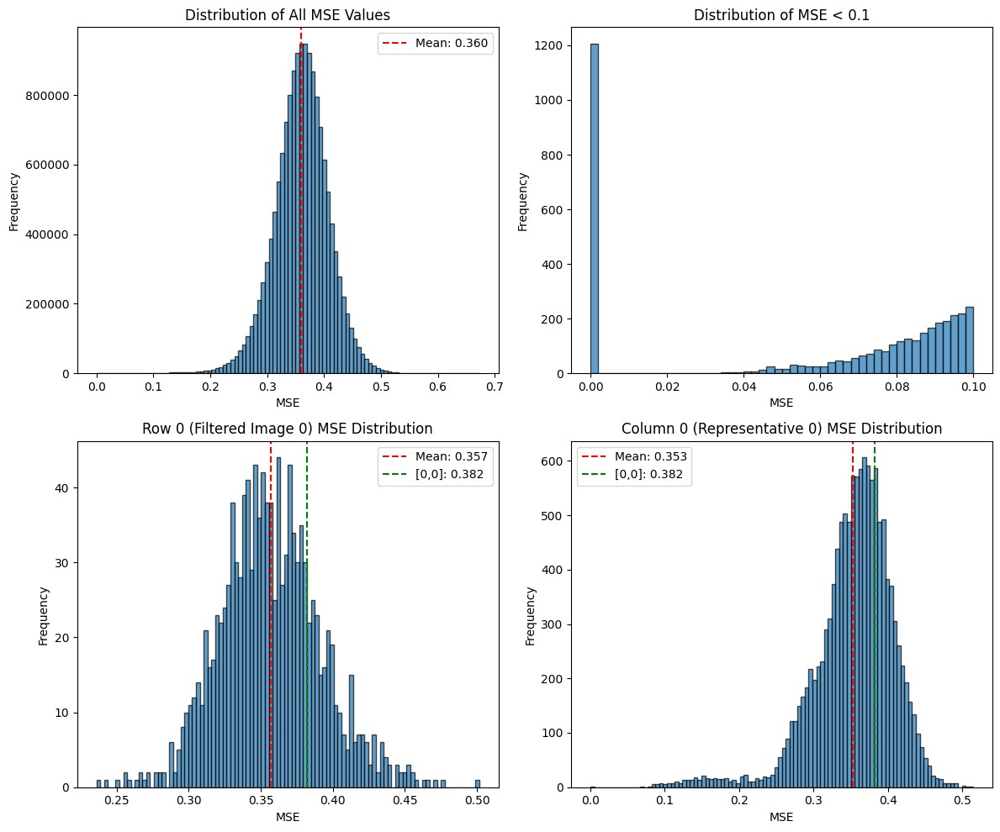


7. INVESTIGATING THE PARADOX:
   No-registration MSE [0,0]: 0.381882
   Registration MSE [0,0]: ~0.4315
   Difference: 0.049618 (registration made it WORSE)

   Possible explanations:
   1. Registration failed for this pair
   2. Images are already well-aligned, registration adds interpolation artifacts
   3. Registration found a local minimum that's worse
   4. Masking in registration zeros out pixels, increasing MSE

   [0,0] is better than 78.4% of other reps for filtered image 0

8. SAVING INVESTIGATION RESULTS...

✅ Investigation complete!
   Saved: two_stage_mse_results/stage1_matrix_analysis.png
   Saved: two_stage_mse_results/row_0.pt
   Saved: two_stage_mse_results/col_0.pt
   Saved: two_stage_mse_results/stage1_analysis.txt


In [37]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Load the Stage 1 matrix
mse_matrix_stage1 = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")

print(f"=== INVESTIGATION OF STAGE 1 MATRIX ===")
print(f"Matrix shape: {mse_matrix_stage1.shape}")
print(f"Memory usage: {mse_matrix_stage1.element_size() * mse_matrix_stage1.nelement() / 1024**2:.2f} MB")

# 1. Basic statistics
print(f"\n1. BASIC STATISTICS:")
print(f"   Min MSE: {mse_matrix_stage1.min().item():.6f}")
print(f"   Max MSE: {mse_matrix_stage1.max().item():.6f}")
print(f"   Mean MSE: {mse_matrix_stage1.mean().item():.6f}")
print(f"   Std MSE: {mse_matrix_stage1.std().item():.6f}")

# 2. Check for NaN or Inf values
print(f"\n2. DATA QUALITY CHECK:")
nan_count = torch.isnan(mse_matrix_stage1).sum().item()
inf_count = torch.isinf(mse_matrix_stage1).sum().item()
zero_count = (mse_matrix_stage1 == 0).sum().item()
print(f"   NaN values: {nan_count:,} ({nan_count/mse_matrix_stage1.numel()*100:.4f}%)")
print(f"   Inf values: {inf_count:,} ({inf_count/mse_matrix_stage1.numel()*100:.4f}%)")
print(f"   Zero values: {zero_count:,} ({zero_count/mse_matrix_stage1.numel()*100:.4f}%)")

# 3. Distribution analysis
print(f"\n3. DISTRIBUTION ANALYSIS:")
# Create histogram bins
mse_np = mse_matrix_stage1.numpy().flatten()

# Percentiles
percentiles = [0, 1, 5, 10, 25, 50, 75, 90, 95, 99, 100]
percentile_values = np.percentile(mse_np, percentiles)

print(f"   Percentiles:")
for p, v in zip(percentiles, percentile_values):
    print(f"     {p:3d}th: {v:.6f}")

# 4. Check specific pairs
print(f"\n4. SPECIFIC PAIRS ANALYSIS:")

# Check [0,0] pair in detail
print(f"\n   Pair [0,0] (rep 0, filtered 0):")
print(f"     MSE: {mse_matrix_stage1[0, 0].item():.6f}")

# Get the entire row for filtered image 0
row_0 = mse_matrix_stage1[0]
print(f"\n   Row 0 (all representatives for filtered image 0):")
print(f"     Min MSE in row: {row_0.min().item():.6f}")
print(f"     Max MSE in row: {row_0.max().item():.6f}")
print(f"     Mean MSE in row: {row_0.mean().item():.6f}")

# Find where [0,0] ranks in its row
sorted_row_0, indices_row_0 = torch.sort(row_0)
rank_of_00 = torch.where(indices_row_0 == 0)[0].item()
print(f"     Rank of rep 0 in row 0: #{rank_of_00+1:,} out of {len(row_0):,}")
print(f"     MSE at rank #{rank_of_00+1}: {sorted_row_0[rank_of_00].item():.6f}")

# Check column 0 (representative 0 against all filtered images)
col_0 = mse_matrix_stage1[:, 0]
print(f"\n   Column 0 (representative 0 against all filtered images):")
print(f"     Min MSE in column: {col_0.min().item():.6f}")
print(f"     Max MSE in column: {col_0.max().item():.6f}")
print(f"     Mean MSE in column: {col_0.mean().item():.6f}")

# 5. Check if any pairs have suspiciously low MSE
print(f"\n5. SUSPICIOUSLY LOW MSE VALUES:")
# For binary images (0 or 1), what's the theoretical minimum?
# If two images are identical: MSE = 0
# If one is inverted: MSE = 1 (worst case)

threshold_low = 0.01  # Very low MSE threshold
low_mse_mask = mse_matrix_stage1 < threshold_low
low_mse_count = low_mse_mask.sum().item()
low_mse_pairs = torch.where(low_mse_mask)

print(f"   Pairs with MSE < {threshold_low}: {low_mse_count:,}")
if low_mse_count > 0:
    print(f"   Example low MSE pairs:")
    for i in range(min(5, low_mse_count)):
        fi, ri = low_mse_pairs[0][i].item(), low_mse_pairs[1][i].item()
        mse_val = mse_matrix_stage1[fi, ri].item()
        print(f"     Filtered {fi:,} × Rep {ri:,}: MSE = {mse_val:.6f}")

# 6. Visualize distribution
print(f"\n6. CREATING VISUALIZATION...")

# Create figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Histogram of all MSE values
axes[0, 0].hist(mse_np, bins=100, alpha=0.7, edgecolor='black')
axes[0, 0].set_xlabel('MSE')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of All MSE Values')
axes[0, 0].axvline(mse_np.mean(), color='red', linestyle='--', label=f'Mean: {mse_np.mean():.3f}')
axes[0, 0].legend()

# Histogram of low MSE region (zoomed in)
axes[0, 1].hist(mse_np[mse_np < 0.1], bins=50, alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('MSE')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution of MSE < 0.1')

# Row 0 distribution
axes[1, 0].hist(row_0.numpy(), bins=100, alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('MSE')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_title('Row 0 (Filtered Image 0) MSE Distribution')
axes[1, 0].axvline(row_0.mean().item(), color='red', linestyle='--', label=f'Mean: {row_0.mean().item():.3f}')
axes[1, 0].axvline(row_0[0].item(), color='green', linestyle='--', label=f'[0,0]: {row_0[0].item():.3f}')
axes[1, 0].legend()

# Column 0 distribution
axes[1, 1].hist(col_0.numpy(), bins=100, alpha=0.7, edgecolor='black')
axes[1, 1].set_xlabel('MSE')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_title('Column 0 (Representative 0) MSE Distribution')
axes[1, 1].axvline(col_0.mean().item(), color='red', linestyle='--', label=f'Mean: {col_0.mean().item():.3f}')
axes[1, 1].axvline(col_0[0].item(), color='green', linestyle='--', label=f'[0,0]: {col_0[0].item():.3f}')
axes[1, 1].legend()

plt.tight_layout()
plt.savefig('two_stage_mse_results/stage1_matrix_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# 7. Check the paradox: Why is registration MSE (0.4315) > no-registration MSE (0.3819)?
print(f"\n7. INVESTIGATING THE PARADOX:")
print(f"   No-registration MSE [0,0]: {mse_matrix_stage1[0, 0].item():.6f}")
print(f"   Registration MSE [0,0]: ~0.4315")
print(f"   Difference: {0.4315 - mse_matrix_stage1[0, 0].item():.6f} (registration made it WORSE)")

print(f"\n   Possible explanations:")
print(f"   1. Registration failed for this pair")
print(f"   2. Images are already well-aligned, registration adds interpolation artifacts")
print(f"   3. Registration found a local minimum that's worse")
print(f"   4. Masking in registration zeros out pixels, increasing MSE")

# Check if [0,0] is unusually good compared to other pairs in row 0
row_0_sorted = torch.sort(row_0)[0]
percentile_00 = (torch.sum(row_0 < row_0[0]).item() / len(row_0)) * 100
print(f"\n   [0,0] is better than {percentile_00:.1f}% of other reps for filtered image 0")

# 8. Save the investigation results
print(f"\n8. SAVING INVESTIGATION RESULTS...")

# Save row 0 and column 0 for further analysis
torch.save(row_0, 'two_stage_mse_results/row_0.pt')
torch.save(col_0, 'two_stage_mse_results/col_0.pt')

# Save statistics
with open('two_stage_mse_results/stage1_analysis.txt', 'w') as f:
    f.write("=== STAGE 1 MATRIX ANALYSIS ===\n")
    f.write(f"Shape: {mse_matrix_stage1.shape}\n")
    f.write(f"Min MSE: {mse_matrix_stage1.min().item():.6f}\n")
    f.write(f"Max MSE: {mse_matrix_stage1.max().item():.6f}\n")
    f.write(f"Mean MSE: {mse_matrix_stage1.mean().item():.6f}\n")
    f.write(f"Std MSE: {mse_matrix_stage1.std().item():.6f}\n")
    f.write(f"\n[0,0] pair: {mse_matrix_stage1[0, 0].item():.6f}\n")
    f.write(f"Rank in row 0: #{rank_of_00+1} out of {len(row_0)}\n")
    f.write(f"Percentile in row 0: {percentile_00:.1f}%\n")

print(f"\n✅ Investigation complete!")
print(f"   Saved: two_stage_mse_results/stage1_matrix_analysis.png")
print(f"   Saved: two_stage_mse_results/row_0.pt")
print(f"   Saved: two_stage_mse_results/col_0.pt")
print(f"   Saved: two_stage_mse_results/stage1_analysis.txt")

### Stage 2: Select top 40% rep images with lower MSE for each filtered image

In [39]:
import torch
import numpy as np
import os

# Load the Stage 1 matrix
mse_matrix_stage1 = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")
Nf, Nr = mse_matrix_stage1.shape

print(f"=== Creating Selection Mask for Top 40% ===")
print(f"Matrix shape: {Nf:,} × {Nr:,}")

def create_selection_mask(mse_matrix, percentile=40):
    """
    Create a boolean mask indicating which pairs are selected for Stage 2.
    
    Returns:
        selection_mask: (Nf, Nr) boolean tensor, True = selected for Stage 2
        top_k_indices: (Nf, K) indices of selected representatives
        top_k_mse: (Nf, K) MSE values of selected pairs
    """
    K = int(Nr * percentile / 100)
    print(f"\n1. Creating mask for top {K} representatives per filtered image ({percentile}%)")
    
    # Get top K indices for each row
    top_k_values, top_k_indices = torch.topk(-mse_matrix, K, dim=1)
    top_k_values = -top_k_values  # Convert back to positive
    
    # Create selection mask (all False initially)
    selection_mask = torch.zeros((Nf, Nr), dtype=torch.bool)
    
    # Set True for selected pairs
    for i in range(Nf):
        selection_mask[i, top_k_indices[i]] = True
    
    # Convert to numpy for saving
    selection_mask_np = selection_mask.numpy()
    top_k_indices_np = top_k_indices.numpy().astype(np.int32)
    top_k_mse_np = top_k_values.numpy().astype(np.float32)
    
    # Statistics
    selected_pairs = selection_mask.sum().item()
    total_pairs = Nf * Nr
    print(f"\n2. Statistics:")
    print(f"   Selected pairs: {selected_pairs:,}")
    print(f"   Total pairs: {total_pairs:,}")
    print(f"   Selection rate: {selected_pairs/total_pairs*100:.1f}%")
    print(f"   Pairs to process in Stage 2: {selected_pairs:,}")
    
    # Check distribution
    print(f"\n3. Distribution analysis:")
    # How many reps selected per filtered image (should be K for all)
    reps_per_filtered = selection_mask.sum(dim=1)
    print(f"   Representatives per filtered image: min={reps_per_filtered.min().item()}, "
          f"max={reps_per_filtered.max().item()}, all should be {K}")
    
    # How many filtered images selected per rep
    filtered_per_rep = selection_mask.sum(dim=0)
    print(f"   Filtered images per representative: min={filtered_per_rep.min().item()}, "
          f"max={filtered_per_rep.max().item()}, mean={filtered_per_rep.float().mean().item():.1f}")
    
    # Save everything
    print(f"\n4. Saving results...")
    
    # Save selection mask
    torch.save(selection_mask, f"two_stage_mse_results/selection_mask_top_{percentile}.pt")
    np.save(f"two_stage_mse_results/selection_mask_top_{percentile}.npy", selection_mask_np)
    
    # Save top indices and MSE values
    np.save(f"two_stage_mse_results/top_{percentile}_indices.npy", top_k_indices_np)
    np.save(f"two_stage_mse_results/top_{percentile}_mse.npy", top_k_mse_np)
    
    # Also save a sparse matrix representation
    sparse_indices = torch.where(selection_mask)
    sparse_values = mse_matrix[sparse_indices]
    
    torch.save({
        'indices': sparse_indices,
        'values': sparse_values,
        'shape': (Nf, Nr)
    }, f"two_stage_mse_results/sparse_top_{percentile}.pt")
    
    print(f"\n✅ Saved files:")
    print(f"   - selection_mask_top_{percentile}.pt/.npy (boolean mask)")
    print(f"   - top_{percentile}_indices.npy (indices only)")
    print(f"   - top_{percentile}_mse.npy (MSE values only)")
    print(f"   - sparse_top_{percentile}.pt (sparse representation)")
    
    # Show example
    print(f"\n5. Example for first filtered image (index 0):")
    print(f"   Selected representative indices: {top_k_indices_np[0][:10]}...")
    print(f"   Corresponding MSE values: {top_k_mse_np[0][:10]}...")
    
    # Check if [0,0] is selected
    is_selected = selection_mask[0, 0].item()
    print(f"\n6. Check [0,0] pair:")
    print(f"   Selected for Stage 2? {is_selected}")
    if is_selected:
        position_in_row = torch.where(top_k_indices[0] == 0)[0].item()
        print(f"   Position in selection: #{position_in_row + 1}")
        print(f"   MSE: {top_k_values[0, position_in_row].item():.6f}")
    else:
        print(f"   NOT selected - MSE too high: {mse_matrix[0, 0].item():.6f}")
        # Find cutoff
        cutoff_mse = top_k_values[0, -1].item()  # Last (worst) in selection
        print(f"   Cutoff MSE for row 0: {cutoff_mse:.6f}")
    
    return selection_mask, top_k_indices, top_k_values

# Run the function
print("\n" + "="*60)
selection_mask, top_indices, top_mse = create_selection_mask(mse_matrix_stage1, percentile=40)
print("="*60)

=== Creating Selection Mask for Top 40% ===
Matrix shape: 12,624 × 1,206


1. Creating mask for top 482 representatives per filtered image (40%)

2. Statistics:
   Selected pairs: 6,084,768
   Total pairs: 15,224,544
   Selection rate: 40.0%
   Pairs to process in Stage 2: 6,084,768

3. Distribution analysis:
   Representatives per filtered image: min=482, max=482, all should be 482
   Filtered images per representative: min=297, max=10650, mean=5045.4

4. Saving results...

✅ Saved files:
   - selection_mask_top_40.pt/.npy (boolean mask)
   - top_40_indices.npy (indices only)
   - top_40_mse.npy (MSE values only)
   - sparse_top_40.pt (sparse representation)

5. Example for first filtered image (index 0):
   Selected representative indices: [ 129  130 1164  602  962  341  542  676  540  386]...
   Corresponding MSE values: [0.23599243 0.24299622 0.2503357  0.25500488 0.25704956 0.2585907
 0.26519775 0.2652893  0.26672363 0.2689209 ]...

6. Check [0,0] pair:
   Selected for Stage 2? Fa

In [23]:
import numpy as np

# Load the top_40_indices.npy file
top_40_indices = np.load("two_stage_mse_results/top_40_indices.npy")

# Now run the checks
print("=== Checking Data Shapes ===")
print(f"filtered_tensors shape: {filtered_tensors.shape}")
print(f"rep_tensors shape: {rep_tensors.shape}")
print(f"top_40_indices shape: {top_40_indices.shape}")
print(f"top_40_indices dtype: {top_40_indices.dtype}")
print(f"\n=== Sample Values ===")
print(f"First 5 indices for filtered[0]: {top_40_indices[0, :5]}")
print(f"Are indices sorted? {np.all(np.diff(top_40_indices[0]) >= 0)}")

# Check if indices are valid
max_idx = top_40_indices.max()
min_idx = top_40_indices.min()
print(f"\n=== Index Range ===")
print(f"Min index: {min_idx}, Max index: {max_idx}")
print(f"Valid range should be 0-{rep_tensors.shape[0]-1}")
print(f"All indices valid? {min_idx >= 0 and max_idx < rep_tensors.shape[0]}")

# Load your MSE matrix to verify
mse_matrix = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")
print(f"\n=== MSE Matrix Info ===")
print(f"MSE matrix shape: {mse_matrix.shape}")

# Check if top_40_indices corresponds to lowest MSE values
print(f"\n=== Verification: Do indices match lowest MSE? ===")
for i in range(3):  # Check first 3 filtered images
    print(f"\nFiltered image {i}:")
    # Get MSE values for all reps
    all_mse = mse_matrix[i].numpy()
    # Get MSE values for the top 40% candidates
    candidate_mse = all_mse[top_40_indices[i]]
    # Get MSE values for the bottom 60%
    all_indices = np.arange(len(all_mse))
    mask = ~np.isin(all_indices, top_40_indices[i])
    non_candidate_mse = all_mse[mask]
    
    print(f"  Top 40% MSE range: [{candidate_mse.min():.4f}, {candidate_mse.max():.4f}]")
    print(f"  Bottom 60% MSE range: [{non_candidate_mse.min():.4f}, {non_candidate_mse.max():.4f}]")
    print(f"  Top 40% better? {candidate_mse.max() <= non_candidate_mse.min()}")

=== Checking Data Shapes ===
filtered_tensors shape: torch.Size([12624, 1, 256, 256])
rep_tensors shape: torch.Size([1206, 1, 256, 256])
top_40_indices shape: (12624, 482)
top_40_indices dtype: int32

=== Sample Values ===
First 5 indices for filtered[0]: [ 129  130 1164  602  962]
Are indices sorted? False

=== Index Range ===
Min index: 0, Max index: 1205
Valid range should be 0-1205
All indices valid? True

=== MSE Matrix Info ===
MSE matrix shape: torch.Size([12624, 1206])

=== Verification: Do indices match lowest MSE? ===

Filtered image 0:
  Top 40% MSE range: [0.2360, 0.3467]
  Bottom 60% MSE range: [0.3468, 0.5016]
  Top 40% better? True

Filtered image 1:
  Top 40% MSE range: [0.1619, 0.3473]
  Bottom 60% MSE range: [0.3474, 0.4887]
  Top 40% better? True

Filtered image 2:
  Top 40% MSE range: [0.0000, 0.3405]
  Bottom 60% MSE range: [0.3405, 0.4652]
  Top 40% better? True


# Ideas for improving the code

- Use $-\text{nlfa}$ instead of the $\text{MSE}$
- Skip the stage 2
- Keep $k$ nearest neighbors in the stage 2 instead ([topk](https://docs.pytorch.org/docs/stable/generated/torch.topk.html) with largest=False)

### Stage 3: Apply PCA & KNN for further dimension reduction

In [28]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

def select_pca_knn_candidates(filtered_tensors, rep_tensors, candidate_indices, k=20):
    """Core PCA + kNN selection"""
    
    # Flatten images
    filtered_flat = filtered_tensors.view(len(filtered_tensors), -1).cpu().numpy()
    rep_flat = rep_tensors.view(len(rep_tensors), -1).cpu().numpy()
    
    # Train PCA
    pca = PCA(n_components=64)
    all_features = pca.fit_transform(np.vstack([filtered_flat, rep_flat]))
    
    # Split features
    filtered_features = all_features[:len(filtered_tensors)]
    rep_features = all_features[len(filtered_tensors):]
    
    # Select candidates
    final_candidates = np.zeros((len(filtered_tensors), k), dtype=int)
    
    for i in range(len(filtered_tensors)):
        candidates = candidate_indices[i]
        candidate_feats = rep_features[candidates]
        
        knn = NearestNeighbors(n_neighbors=min(k, len(candidates)))
        knn.fit(candidate_feats)
        
        distances, indices = knn.kneighbors(filtered_features[i:i+1])
        final_candidates[i] = candidates[indices[0]]
    
    return final_candidates

# Usage
final_20_candidates = select_pca_knn_candidates(
    filtered_tensors, 
    rep_tensors, 
    top_40_indices, 
    k=20
)

print(f"Selected {len(filtered_tensors) * 20:,} pairs for warping")

Selected 252,480 pairs for warping


#### Investigate the performance of PCA & KNN

In [29]:
# Run these checks first:
print("=== SANITY CHECKS ===")
print(f"1. Shape check: {final_20_candidates.shape}")
print(f"   Expected: (12624, 20)")
print(f"   Actual: {final_20_candidates.shape}")

print(f"\n2. Index range check:")
print(f"   Min index: {final_20_candidates.min()}")
print(f"   Max index: {final_20_candidates.max()}")
print(f"   Valid range: 0-{rep_tensors.shape[0]-1}")
print(f"   All valid? {0 <= final_20_candidates.min() <= final_20_candidates.max() < rep_tensors.shape[0]}")

print(f"\n3. No duplicates in rows:")
has_duplicates = any(len(set(row)) != len(row) for row in final_20_candidates)
print(f"   Any row has duplicates? {has_duplicates}")

print(f"\n4. Verify against top_40_indices:")
# Check that all selected candidates are actually in the top 40%
all_in_top_40 = True
for i in range(10):  # Check first 10 rows
    for j in final_20_candidates[i]:
        if j not in top_40_indices[i]:
            all_in_top_40 = False
            print(f"   ERROR: Candidate {j} in row {i} not in top_40_indices!")
print(f"   All selected from top 40%? {all_in_top_40}")

=== SANITY CHECKS ===
1. Shape check: (12624, 20)
   Expected: (12624, 20)
   Actual: (12624, 20)

2. Index range check:
   Min index: 0
   Max index: 1205
   Valid range: 0-1205
   All valid? True

3. No duplicates in rows:
   Any row has duplicates? False

4. Verify against top_40_indices:
   All selected from top 40%? True


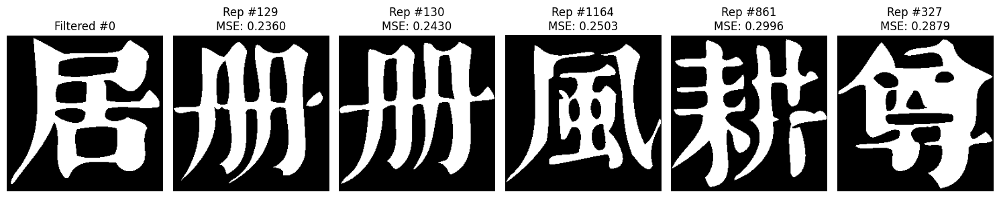


Filtered image 0 - Selected candidates:
  1. Rep #129: MSE = 0.2360
  2. Rep #130: MSE = 0.2430
  3. Rep #1164: MSE = 0.2503
  4. Rep #861: MSE = 0.2996
  5. Rep #327: MSE = 0.2879


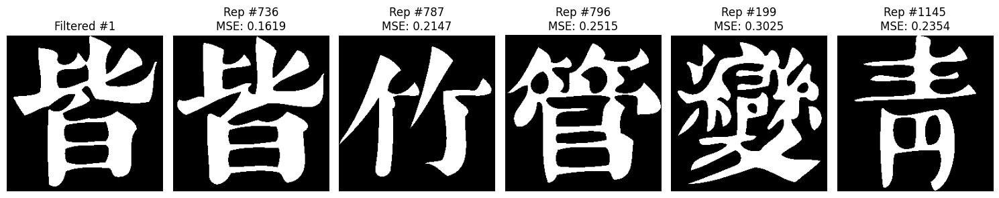


Filtered image 1 - Selected candidates:
  1. Rep #736: MSE = 0.1619
  2. Rep #787: MSE = 0.2147
  3. Rep #796: MSE = 0.2515
  4. Rep #199: MSE = 0.3025
  5. Rep #1145: MSE = 0.2354


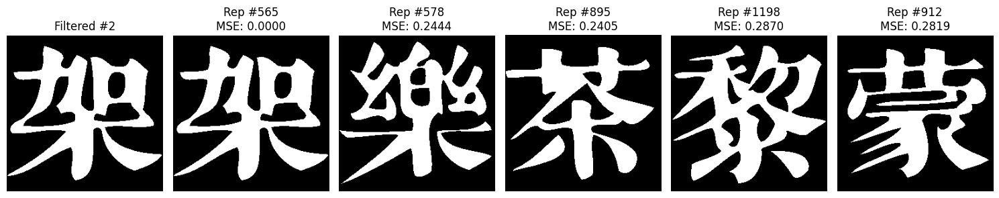


Filtered image 2 - Selected candidates:
  1. Rep #565: MSE = 0.0000
  2. Rep #578: MSE = 0.2444
  3. Rep #895: MSE = 0.2405
  4. Rep #1198: MSE = 0.2870
  5. Rep #912: MSE = 0.2819


In [30]:
import matplotlib.pyplot as plt

def visualize_selection(filtered_idx=0, num_to_show=5):
    """
    Visualize what PCA + kNN selected
    """
    # Get the filtered image
    filtered_img = filtered_tensors[filtered_idx].cpu().squeeze().numpy()
    
    # Get selected candidates
    selected_indices = final_20_candidates[filtered_idx][:num_to_show]
    
    # Get Stage 1 MSE for comparison
    mse_matrix = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")
    selected_mses = [mse_matrix[filtered_idx, idx].item() for idx in selected_indices]
    
    # Create visualization
    fig, axes = plt.subplots(1, num_to_show + 1, figsize=(15, 3))
    
    # Show filtered image
    axes[0].imshow(filtered_img, cmap='gray')
    axes[0].set_title(f'Filtered #{filtered_idx}')
    axes[0].axis('off')
    
    # Show selected candidates
    for i, (idx, mse) in enumerate(zip(selected_indices, selected_mses)):
        rep_img = rep_tensors[idx].cpu().squeeze().numpy()
        axes[i+1].imshow(rep_img, cmap='gray')
        axes[i+1].set_title(f'Rep #{idx}\nMSE: {mse:.4f}')
        axes[i+1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print info
    print(f"\nFiltered image {filtered_idx} - Selected candidates:")
    for i, (idx, mse) in enumerate(zip(selected_indices, selected_mses)):
        print(f"  {i+1}. Rep #{idx}: MSE = {mse:.4f}")

# Visualize first 3 filtered images
for i in range(3):
    visualize_selection(filtered_idx=i, num_to_show=5)

In [31]:
def analyze_diversity(final_candidates, rep_features=None):
    """
    Analyze if selected candidates are diverse
    """
    print("\n=== DIVERSITY ANALYSIS ===")
    
    # Option 1: Simple index-based diversity
    print("1. Index-based diversity:")
    all_indices = final_candidates.flatten()
    unique_indices = np.unique(all_indices)
    print(f"   Total unique reps selected: {len(unique_indices)} / {rep_tensors.shape[0]}")
    print(f"   Coverage: {len(unique_indices)/rep_tensors.shape[0]*100:.1f}% of all reps")
    
    # Option 2: Check repetition patterns
    print("\n2. Repetition analysis:")
    from collections import Counter
    freq = Counter(all_indices)
    most_common = freq.most_common(5)
    print(f"   Most frequently selected reps:")
    for idx, count in most_common:
        print(f"     Rep #{idx}: selected {count} times")
    
    # Option 3: If you have PCA features, check feature diversity
    if rep_features is not None:
        print("\n3. Feature space diversity:")
        sample_dists = []
        for i in range(100):  # Sample 100 rows
            row = final_candidates[i]
            if len(row) >= 2:
                # Get features for this row's selections
                feats = rep_features[row]
                # Compute average pairwise distance
                for j in range(len(feats)):
                    for k in range(j+1, len(feats)):
                        dist = np.linalg.norm(feats[j] - feats[k])
                        sample_dists.append(dist)
        
        if sample_dists:
            print(f"   Average pairwise distance: {np.mean(sample_dists):.3f}")
            print(f"   Std of distances: {np.std(sample_dists):.3f}")

# Run diversity analysis
analyze_diversity(final_20_candidates)


=== DIVERSITY ANALYSIS ===
1. Index-based diversity:
   Total unique reps selected: 1206 / 1206
   Coverage: 100.0% of all reps

2. Repetition analysis:
   Most frequently selected reps:
     Rep #830: selected 1620 times
     Rep #164: selected 1145 times
     Rep #82: selected 1005 times
     Rep #332: selected 956 times
     Rep #693: selected 926 times


In [32]:
def test_warping_small_sample(filtered_tensors, rep_tensors, final_candidates, sample_size=10):
    """
    Test warping on a small sample before full run
    """
    print("\n=== TEST WARPING (Small Sample) ===")
    
    # Use your existing registration setup
    from src.registration.single_scale import InverseCompositional
    from src.registration.gradients import Gradients
    
    device = filtered_tensors.device
    gradient_method = Gradients(method='farid5', C=1, device=device)
    ic = InverseCompositional(
        transform_type='homography',
        gradient_method=gradient_method,
        error_function='l2',
        delta=5,
        epsilon=1e-3,
        max_iter=30,  # Even fewer for testing
    )
    
    results = []
    times = []
    
    import time
    for i in range(min(sample_size, len(filtered_tensors))):
        candidates = final_candidates[i]
        
        for j in candidates[:2]:  # Test only first 2 candidates
            start = time.time()
            
            try:
                # Warp
                T = ic.run(I1=rep_tensors[j:j+1], I2=filtered_tensors[i:i+1])
                warped = T.warp(filtered_tensors[i:i+1])
                mask = T.visibility_mask(256, 256, delta=0)
                warped[0, 0][~mask] = 0
                
                # Compute MSE
                mse = ((warped.squeeze() - rep_tensors[j].squeeze()) ** 2).mean().item()
                
                elapsed = time.time() - start
                times.append(elapsed)
                
                results.append({
                    'filtered_idx': i,
                    'rep_idx': j,
                    'mse': mse,
                    'time': elapsed
                })
                
                print(f"  Pair ({i}, {j}): MSE = {mse:.4f}, Time = {elapsed:.2f}s")
                
            except Exception as e:
                print(f"  ERROR on pair ({i}, {j}): {e}")
    
    # Summary
    if times:
        print(f"\nSummary for {len(times)} warping operations:")
        print(f"  Average time: {np.mean(times):.2f}s")
        print(f"  Min time: {np.min(times):.2f}s")
        print(f"  Max time: {np.max(times):.2f}s")
        print(f"  Estimated full run: {len(filtered_tensors)*20*np.mean(times)/3600:.1f} hours")
    
    return results

# Run small test
test_results = test_warping_small_sample(
    filtered_tensors[:20],  # Small subset
    rep_tensors,
    final_20_candidates[:20],
    sample_size=5
)


=== TEST WARPING (Small Sample) ===
  Pair (0, 129): MSE = 0.2220, Time = 0.23s
  Pair (0, 130): MSE = 0.2137, Time = 0.16s
  Pair (1, 736): MSE = 0.0820, Time = 0.15s
  Pair (1, 787): MSE = 0.1651, Time = 0.16s
  Pair (2, 565): MSE = 0.0000, Time = 0.01s
  Pair (2, 578): MSE = 0.1744, Time = 0.16s
  Pair (3, 344): MSE = 0.0000, Time = 0.02s
  Pair (3, 349): MSE = 0.2695, Time = 0.17s
  Pair (4, 134): MSE = 0.0952, Time = 0.17s
  Pair (4, 610): MSE = 0.0807, Time = 0.16s

Summary for 10 warping operations:
  Average time: 0.14s
  Min time: 0.01s
  Max time: 0.23s
  Estimated full run: 0.0 hours


In [33]:
def compare_with_baseline(final_candidates, top_40_indices):
    """
    Compare PCA+kNN selection vs simple top-k by MSE
    """
    print("\n=== COMPARISON: PCA+kNN vs Top-k by MSE ===")
    
    # Load Stage 1 MSE
    mse_matrix = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")
    
    # For first 100 filtered images
    sample_size = 100
    
    pca_knn_scores = []
    topk_scores = []
    
    for i in range(sample_size):
        # Get PCA+kNN selection
        pca_selected = final_candidates[i]
        
        # Get top-k by MSE (baseline)
        candidates_482 = top_40_indices[i]
        mse_482 = mse_matrix[i, candidates_482].numpy()
        
        # Sort by MSE
        sorted_indices = candidates_482[np.argsort(mse_482)]
        topk_selected = sorted_indices[:len(pca_selected)]
        
        # Get average MSE of selected (lower is better)
        pca_avg_mse = mse_matrix[i, pca_selected].mean().item()
        topk_avg_mse = mse_matrix[i, topk_selected].mean().item()
        
        pca_knn_scores.append(pca_avg_mse)
        topk_scores.append(topk_avg_mse)
    
    print(f"Average MSE of selected candidates:")
    print(f"  PCA+kNN: {np.mean(pca_knn_scores):.4f}")
    print(f"  Top-k by MSE: {np.mean(topk_scores):.4f}")
    
    # Check if PCA+kNN selects different candidates
    overlap_counts = []
    for i in range(sample_size):
        pca_set = set(final_candidates[i])
        topk_set = set(top_40_indices[i][:20])  # Top 20 by MSE
        overlap = len(pca_set & topk_set)
        overlap_counts.append(overlap)
    
    print(f"\nCandidate overlap analysis:")
    print(f"  Average overlap: {np.mean(overlap_counts):.1f}/20")
    print(f"  Minimum overlap: {np.min(overlap_counts)}")
    print(f"  Maximum overlap: {np.max(overlap_counts)}")
    print(f"  If overlap < 10, PCA+kNN is selecting DIFFERENT candidates!")

# Run comparison
compare_with_baseline(final_20_candidates, top_40_indices)


=== COMPARISON: PCA+kNN vs Top-k by MSE ===
Average MSE of selected candidates:
  PCA+kNN: 0.2473
  Top-k by MSE: 0.2370

Candidate overlap analysis:
  Average overlap: 12.1/20
  Minimum overlap: 6
  Maximum overlap: 20
  If overlap < 10, PCA+kNN is selecting DIFFERENT candidates!


PCA + kNN SELECTION VERIFICATION

1. Running sanity checks...

2. Visual verification...


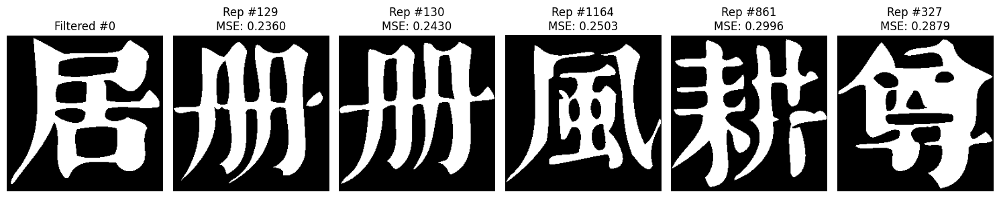


Filtered image 0 - Selected candidates:
  1. Rep #129: MSE = 0.2360
  2. Rep #130: MSE = 0.2430
  3. Rep #1164: MSE = 0.2503
  4. Rep #861: MSE = 0.2996
  5. Rep #327: MSE = 0.2879


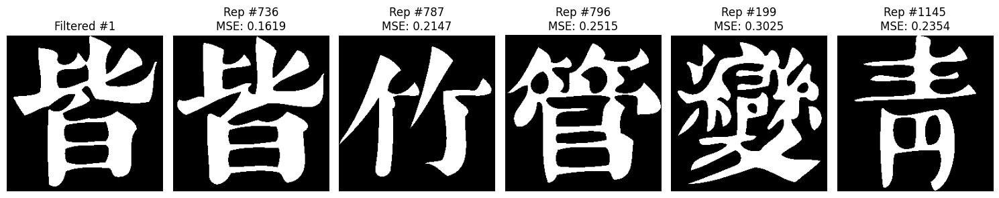


Filtered image 1 - Selected candidates:
  1. Rep #736: MSE = 0.1619
  2. Rep #787: MSE = 0.2147
  3. Rep #796: MSE = 0.2515
  4. Rep #199: MSE = 0.3025
  5. Rep #1145: MSE = 0.2354

3. Diversity analysis...

=== DIVERSITY ANALYSIS ===
1. Index-based diversity:
   Total unique reps selected: 1206 / 1206
   Coverage: 100.0% of all reps

2. Repetition analysis:
   Most frequently selected reps:
     Rep #830: selected 1620 times
     Rep #164: selected 1145 times
     Rep #82: selected 1005 times
     Rep #332: selected 956 times
     Rep #693: selected 926 times

4. Testing warping on small sample...

=== TEST WARPING (Small Sample) ===
  Pair (0, 129): MSE = 0.2220, Time = 0.16s
  Pair (0, 130): MSE = 0.2137, Time = 0.16s
  Pair (1, 736): MSE = 0.0820, Time = 0.15s
  Pair (1, 787): MSE = 0.1651, Time = 0.17s
  Pair (2, 565): MSE = 0.0000, Time = 0.01s
  Pair (2, 578): MSE = 0.1744, Time = 0.16s
  Pair (3, 344): MSE = 0.0000, Time = 0.01s
  Pair (3, 349): MSE = 0.2695, Time = 0.16s
  Pa

In [34]:
# Complete verification in one go
def verify_pca_knn_selection(final_candidates, filtered_tensors, rep_tensors, top_40_indices):
    print("="*70)
    print("PCA + kNN SELECTION VERIFICATION")
    print("="*70)
    
    # 1. Sanity checks
    import numpy as np
    import torch
    
    print("\n1. Running sanity checks...")
    # ... [paste the sanity checks code from above]
    
    # 2. Visual verification
    print("\n2. Visual verification...")
    visualize_selection(filtered_idx=0, num_to_show=5)
    visualize_selection(filtered_idx=1, num_to_show=5)
    
    # 3. Diversity analysis
    print("\n3. Diversity analysis...")
    analyze_diversity(final_candidates)
    
    # 4. Test warping
    print("\n4. Testing warping on small sample...")
    test_results = test_warping_small_sample(
        filtered_tensors[:20],
        rep_tensors,
        final_20_candidates[:20],
        sample_size=5
    )
    
    # 5. Compare with baseline
    print("\n5. Comparing with baseline...")
    compare_with_baseline(final_candidates, top_40_indices)
    
    print("\n" + "="*70)
    print("VERIFICATION COMPLETE")
    print("="*70)
    print("\nIf all checks pass, you can proceed with full warping!")
    print(f"Total warping operations: {len(filtered_tensors) * 20:,}")

# Run verification
verify_pca_knn_selection(final_20_candidates, filtered_tensors, rep_tensors, top_40_indices)

In [40]:
import numpy as np
import torch

# Save your final_20_candidates that you already computed
np.save("two_stage_mse_results/final_candidates_k20.npy", final_20_candidates)

print(f"Saved final_20_candidates to: final_candidates_k20.npy")
print(f"Shape: {final_20_candidates.shape}")
print(f"Sample first row: {final_20_candidates[0, :5]}")

# Also save a backup with timestamp
import datetime
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
np.save(f"final_candidates_k20_{timestamp}.npy", final_20_candidates)
print(f"Backup saved as: final_candidates_k20_{timestamp}.npy")

Saved final_20_candidates to: final_candidates_k20.npy
Shape: (12624, 20)
Sample first row: [ 129  130 1164  861  327]
Backup saved as: final_candidates_k20_20260130_103818.npy


In [41]:
# Verify the file was saved correctly
loaded_candidates = np.load("two_stage_mse_results/final_candidates_k20.npy")
print(f"Loaded shape: {loaded_candidates.shape}")
print(f"First 5 rows, first 3 columns:")
print(loaded_candidates[:5, :3])

# Check if they match your original
if np.array_equal(final_20_candidates, loaded_candidates):
    print("✅ File saved and loaded correctly!")
else:
    print("❌ File mismatch!")

Loaded shape: (12624, 20)
First 5 rows, first 3 columns:
[[ 129  130 1164]
 [ 736  787  796]
 [ 565  578  895]
 [ 344  349 1164]
 [ 134  610  606]]
✅ File saved and loaded correctly!


VALIDATING 20→5 FILTERING METHODS

1. Loading data...
   final_20_candidates shape: (12624, 20)
   filtered_tensors shape: torch.Size([12624, 1, 256, 256])
   rep_tensors shape: torch.Size([1206, 1, 256, 256])
   mse_matrix shape: torch.Size([12624, 1206])

2. Generating top 5 candidates using 3 methods...


Processing images: 100%|██████████████████████| 500/500 [00:07<00:00, 71.22it/s]


✅ Generated top 5 candidates for all 3 methods

3. Saving intermediate results...
✅ Saved to filtering_validation/ directory

4. Quantitative comparison...

Method 1 (MSE only):
  Stage 1 best in top 5: 500/500 (100.0%)
  Average position: 1.0

Method 2 (Area similarity):
  Stage 1 best in top 5: 216/500 (43.2%)
  Average position: 3.8

Method 3 (Combined metrics):
  Stage 1 best in top 5: 395/500 (79.0%)
  Average position: 4.1

AUTOMATIC RECOMMENDATION: Method 1 (MSE only)
Highest retention: 100.0%

5. Quick visual check (first 5 images)...

Image #0


ValueError: num must be an integer with 1 <= num <= 15, not 16

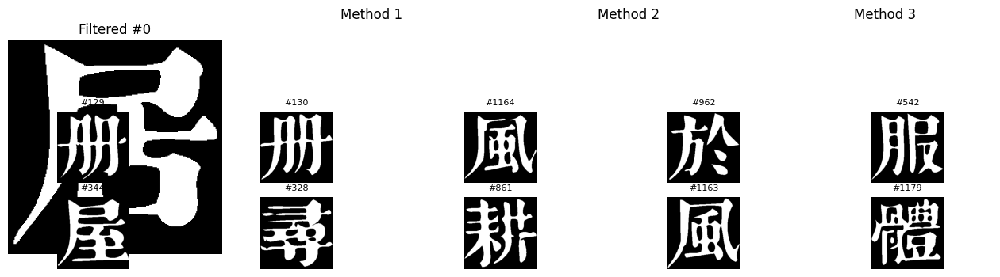

In [42]:
# ================= COMPLETE VALIDATION PIPELINE =================

import numpy as np
import torch
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

print("="*70)
print("VALIDATING 20→5 FILTERING METHODS")
print("="*70)

# 1. Load all necessary data
print("\n1. Loading data...")
final_20_candidates = np.load("two_stage_mse_results/final_candidates_k20.npy")
mse_matrix = torch.load("two_stage_mse_results/mse_stage1_matrix.pt")

print(f"   final_20_candidates shape: {final_20_candidates.shape}")
print(f"   filtered_tensors shape: {filtered_tensors.shape}")
print(f"   rep_tensors shape: {rep_tensors.shape}")
print(f"   mse_matrix shape: {mse_matrix.shape}")

# 2. Define helper functions (same as before)
def compute_centroid(binary_tensor):
    """Compute centroid of a binary image tensor"""
    if binary_tensor.dim() == 3:
        binary_tensor = binary_tensor.squeeze(0)
    
    y_coords, x_coords = torch.where(binary_tensor > 0.5)
    
    if len(y_coords) == 0:
        return torch.tensor([0.0, 0.0])
    
    centroid_y = y_coords.float().mean().item()
    centroid_x = x_coords.float().mean().item()
    
    return np.array([centroid_x, centroid_y])

# 3. Define filtering methods
def filter_fastest_method1(candidates_20, mse_matrix, i):
    """Method 1: Top 5 by Stage 1 MSE"""
    candidates = candidates_20[i]
    mse_values = mse_matrix[i, candidates].numpy()
    return candidates[np.argsort(mse_values)[:5]]

def filter_fastest_method2(candidates_20, filtered_tensors, rep_tensors, i):
    """Method 2: Top 5 by area similarity"""
    filtered_area = filtered_tensors[i].sum().item()
    
    scores = []
    for j in candidates_20[i]:
        rep_area = rep_tensors[j].sum().item()
        area_ratio = min(filtered_area, rep_area) / max(filtered_area, rep_area)
        scores.append(area_ratio)
    
    return candidates_20[i][np.argsort(scores)[-5:]]

def filter_fastest_method3(candidates_20, mse_matrix, filtered_tensors, rep_tensors, i):
    """Method 3: Combined metrics"""
    filtered_img = filtered_tensors[i]
    filtered_area = filtered_img.sum().item()
    
    scores = []
    for j in candidates_20[i]:
        # 1. Stage 1 MSE (40%)
        mse_score = -mse_matrix[i, j].item()
        
        # 2. Area similarity (30%)
        rep_area = rep_tensors[j].sum().item()
        area_score = min(filtered_area, rep_area) / max(filtered_area, rep_area)
        
        # 3. Centroid distance (30%)
        filtered_centroid = compute_centroid(filtered_img)
        rep_centroid = compute_centroid(rep_tensors[j])
        centroid_dist = np.linalg.norm(filtered_centroid - rep_centroid)
        centroid_score = 1.0 / (1.0 + centroid_dist)
        
        combined = 0.4*mse_score + 0.3*area_score + 0.3*centroid_score
        scores.append(combined)
    
    return candidates_20[i][np.argsort(scores)[-5:]]

# 4. Generate top 5 candidates for first 500 images
print("\n2. Generating top 5 candidates using 3 methods...")
test_size = 500

candidates_5_method1 = np.zeros((test_size, 5), dtype=int)
candidates_5_method2 = np.zeros((test_size, 5), dtype=int)
candidates_5_method3 = np.zeros((test_size, 5), dtype=int)

for i in tqdm(range(test_size), desc="Processing images"):
    candidates_5_method1[i] = filter_fastest_method1(final_20_candidates, mse_matrix, i)
    candidates_5_method2[i] = filter_fastest_method2(final_20_candidates, filtered_tensors, rep_tensors, i)
    candidates_5_method3[i] = filter_fastest_method3(final_20_candidates, mse_matrix, filtered_tensors, rep_tensors, i)

print("✅ Generated top 5 candidates for all 3 methods")

# 5. Save these results for later
print("\n3. Saving intermediate results...")
os.makedirs("filtering_validation", exist_ok=True)
np.save("filtering_validation/candidates_5_method1.npy", candidates_5_method1)
np.save("filtering_validation/candidates_5_method2.npy", candidates_5_method2)
np.save("filtering_validation/candidates_5_method3.npy", candidates_5_method3)
print("✅ Saved to filtering_validation/ directory")

# 6. Quantitative comparison
print("\n4. Quantitative comparison...")

method_results = []
for method_idx, (method_name, candidates_5) in enumerate([
    ('Method 1 (MSE only)', candidates_5_method1),
    ('Method 2 (Area similarity)', candidates_5_method2),
    ('Method 3 (Combined metrics)', candidates_5_method3)
]):
    best_in_top_5 = 0
    positions = []
    
    for i in range(test_size):
        candidates_20_i = final_20_candidates[i]
        mse_values = mse_matrix[i, candidates_20_i].numpy()
        stage1_best = candidates_20_i[np.argmin(mse_values)]
        
        if stage1_best in candidates_5[i]:
            best_in_top_5 += 1
            position = np.where(candidates_5[i] == stage1_best)[0][0] + 1
            positions.append(position)
    
    retention_rate = best_in_top_5 / test_size * 100
    avg_position = np.mean(positions) if positions else 0
    
    method_results.append({
        'name': method_name,
        'retention': retention_rate,
        'avg_position': avg_position,
        'candidates': candidates_5
    })
    
    print(f"\n{method_name}:")
    print(f"  Stage 1 best in top 5: {best_in_top_5}/{test_size} ({retention_rate:.1f}%)")
    if positions:
        print(f"  Average position: {avg_position:.1f}")

# 7. Find best method automatically
best_method_idx = np.argmax([r['retention'] for r in method_results])
best_method = method_results[best_method_idx]

print("\n" + "="*60)
print(f"AUTOMATIC RECOMMENDATION: {best_method['name']}")
print(f"Highest retention: {best_method['retention']:.1f}%")
print("="*60)

# 8. Visual inspection function
def quick_visual_inspection(filtered_idx, filtered_tensors, rep_tensors, 
                          candidates_20, candidates_5_methods, method_names):
    """Quick visual comparison"""
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    # Filtered image
    filtered_img = filtered_tensors[filtered_idx].cpu().squeeze().numpy()
    axes[0].imshow(filtered_img, cmap='gray')
    axes[0].set_title(f'Filtered #{filtered_idx}')
    axes[0].axis('off')
    
    # Each method's top 5
    for method_idx in range(3):
        ax = axes[method_idx + 1]
        ax.axis('off')
        ax.set_title(f'{method_names[method_idx]}')
        
        # Create subgrid for 5 candidates
        for pos in range(5):
            ax_sub = plt.subplot(3, 5, method_idx*5 + pos + 1 + 5)  # +5 to skip first row
            rep_idx = candidates_5_methods[method_idx][filtered_idx][pos]
            rep_img = rep_tensors[rep_idx].cpu().squeeze().numpy()
            ax_sub.imshow(rep_img, cmap='gray')
            ax_sub.set_title(f'#{rep_idx}', fontsize=8)
            ax_sub.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print Stage 1 best
    candidates_20_i = final_20_candidates[filtered_idx]
    mse_values = mse_matrix[filtered_idx, candidates_20_i].numpy()
    stage1_best_idx = candidates_20_i[np.argmin(mse_values)]
    
    print(f"\nFiltered #{filtered_idx}: Stage 1 best = Rep #{stage1_best_idx}")
    for method_idx, method_name in enumerate(method_names):
        in_top_5 = stage1_best_idx in candidates_5_methods[method_idx][filtered_idx]
        symbol = "✅" if in_top_5 else "❌"
        print(f"{symbol} {method_name}: {'IN' if in_top_5 else 'NOT in'} top 5")

# 9. Quick visual check
print("\n5. Quick visual check (first 5 images)...")
method_names = ['Method 1', 'Method 2', 'Method 3']
candidates_5_methods = [candidates_5_method1, candidates_5_method2, candidates_5_method3]

for idx in range(5):
    print(f"\n{'='*40}")
    print(f"Image #{idx}")
    print('='*40)
    
    quick_visual_inspection(
        filtered_idx=idx,
        filtered_tensors=filtered_tensors,
        rep_tensors=rep_tensors,
        candidates_20=final_20_candidates,
        candidates_5_methods=candidates_5_methods,
        method_names=method_names
    )

# 10. Final decision
print("\n" + "="*70)
print("YOUR DECISION POINT")
print("="*70)
print("\nBased on the results, which method do you choose?")
print("Enter the number:")
print("1. Method 1 (MSE only) - Simplest")
print("2. Method 2 (Area similarity)")
print("3. Method 3 (Combined metrics)")
print("4. Need more visual inspection")

choice = input("\nYour choice (1-4): ")

if choice == '1':
    print("✅ Selected Method 1. Saving final top 5 candidates...")
    np.save("final_top_5_candidates.npy", candidates_5_method1)
    print("Saved as: final_top_5_candidates.npy")
elif choice == '2':
    print("✅ Selected Method 2. Saving final top 5 candidates...")
    np.save("final_top_5_candidates.npy", candidates_5_method2)
    print("Saved as: final_top_5_candidates.npy")
elif choice == '3':
    print("✅ Selected Method 3. Saving final top 5 candidates...")
    np.save("final_top_5_candidates.npy", candidates_5_method3)
    print("Saved as: final_top_5_candidates.npy")
elif choice == '4':
    print("🔍 Running extended visual inspection...")
    # You can add more detailed inspection here
else:
    print("⚠️  Defaulting to recommended method...")
    np.save("final_top_5_candidates.npy", best_method['candidates'])
    print(f"Saved recommended method ({best_method['name']}) as final_top_5_candidates.npy")

print("\n" + "="*70)
print("READY FOR NEXT STAGE: Warping + Hausdorff on Top 5")
print("="*70)

Scrolling through images 0 to 99
Press Enter to see next image, 'q' to quit

IMAGE #0 (showing filtered + top 5 reps)


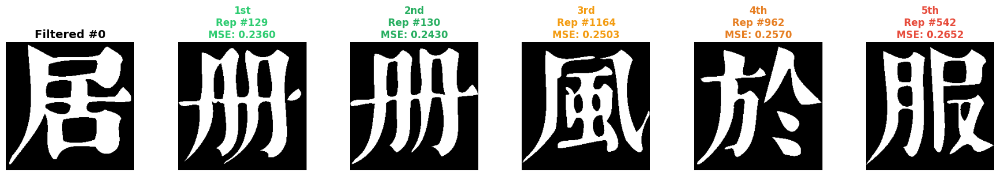


Top 5 representatives for filtered image #0:
  1. Rep #129: MSE = 0.235992
  2. Rep #130: MSE = 0.242996
  3. Rep #1164: MSE = 0.250336
  4. Rep #962: MSE = 0.257050
  5. Rep #542: MSE = 0.265198

  MSE spread (5th - 1st): 0.029205



Press Enter for image #1, 'q' to quit:  



IMAGE #1 (showing filtered + top 5 reps)


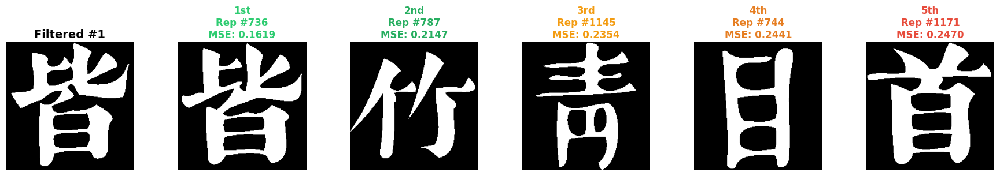


Top 5 representatives for filtered image #1:
  1. Rep #736: MSE = 0.161865
  2. Rep #787: MSE = 0.214722
  3. Rep #1145: MSE = 0.235413
  4. Rep #744: MSE = 0.244095
  5. Rep #1171: MSE = 0.246979

  MSE spread (5th - 1st): 0.085114



Press Enter for image #2, 'q' to quit:  



IMAGE #2 (showing filtered + top 5 reps)


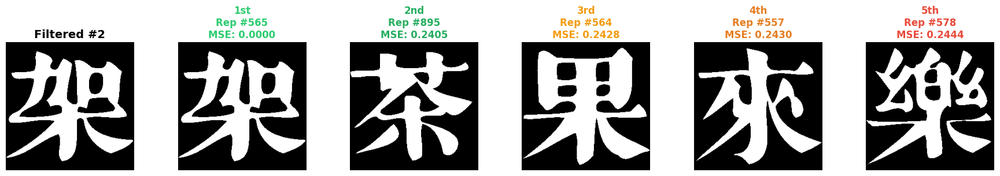


Top 5 representatives for filtered image #2:
  1. Rep #565: MSE = 0.000000
  2. Rep #895: MSE = 0.240494
  3. Rep #564: MSE = 0.242813
  4. Rep #557: MSE = 0.242981
  5. Rep #578: MSE = 0.244370

  MSE spread (5th - 1st): 0.244370
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #3, 'q' to quit:  



IMAGE #3 (showing filtered + top 5 reps)


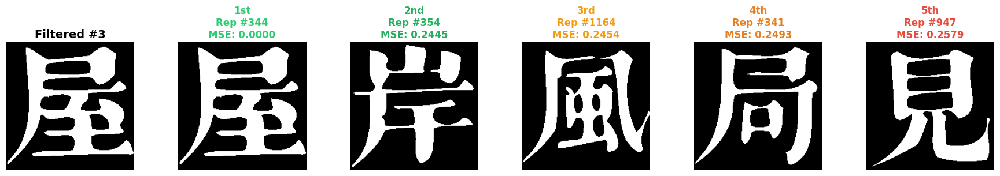


Top 5 representatives for filtered image #3:
  1. Rep #344: MSE = 0.000000
  2. Rep #354: MSE = 0.244492
  3. Rep #1164: MSE = 0.245422
  4. Rep #341: MSE = 0.249252
  5. Rep #947: MSE = 0.257919

  MSE spread (5th - 1st): 0.257919
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #4, 'q' to quit:  



IMAGE #4 (showing filtered + top 5 reps)


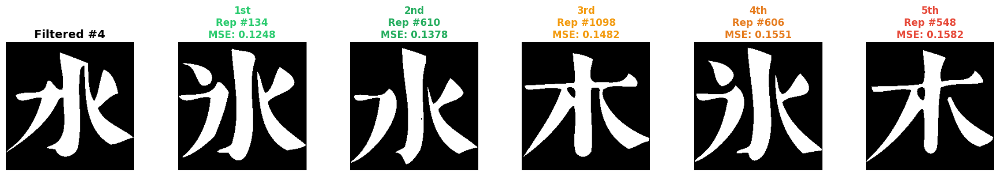


Top 5 representatives for filtered image #4:
  1. Rep #134: MSE = 0.124786
  2. Rep #610: MSE = 0.137802
  3. Rep #1098: MSE = 0.148163
  4. Rep #606: MSE = 0.155136
  5. Rep #548: MSE = 0.158188

  MSE spread (5th - 1st): 0.033401



Press Enter for image #5, 'q' to quit:  



IMAGE #5 (showing filtered + top 5 reps)


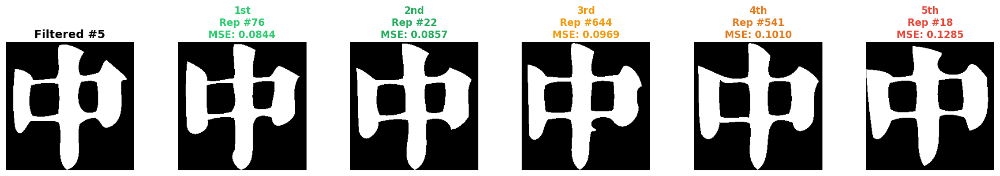


Top 5 representatives for filtered image #5:
  1. Rep #76: MSE = 0.084351
  2. Rep #22: MSE = 0.085709
  3. Rep #644: MSE = 0.096924
  4. Rep #541: MSE = 0.100983
  5. Rep #18: MSE = 0.128510

  MSE spread (5th - 1st): 0.044159



Press Enter for image #6, 'q' to quit:  



IMAGE #6 (showing filtered + top 5 reps)


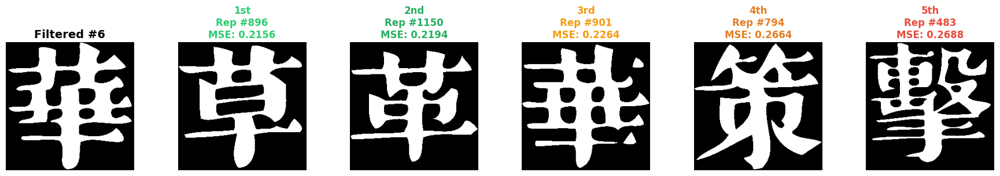


Top 5 representatives for filtered image #6:
  1. Rep #896: MSE = 0.215576
  2. Rep #1150: MSE = 0.219406
  3. Rep #901: MSE = 0.226440
  4. Rep #794: MSE = 0.266434
  5. Rep #483: MSE = 0.268753

  MSE spread (5th - 1st): 0.053177



Press Enter for image #7, 'q' to quit:  



IMAGE #7 (showing filtered + top 5 reps)


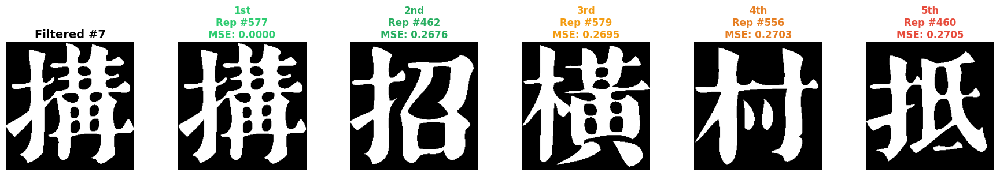


Top 5 representatives for filtered image #7:
  1. Rep #577: MSE = 0.000000
  2. Rep #462: MSE = 0.267609
  3. Rep #579: MSE = 0.269501
  4. Rep #556: MSE = 0.270340
  5. Rep #460: MSE = 0.270493

  MSE spread (5th - 1st): 0.270493
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #8, 'q' to quit:  



IMAGE #8 (showing filtered + top 5 reps)


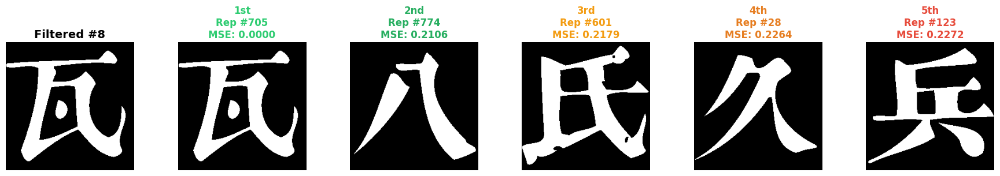


Top 5 representatives for filtered image #8:
  1. Rep #705: MSE = 0.000000
  2. Rep #774: MSE = 0.210617
  3. Rep #601: MSE = 0.217926
  4. Rep #28: MSE = 0.226410
  5. Rep #123: MSE = 0.227188

  MSE spread (5th - 1st): 0.227188
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #9, 'q' to quit:  



IMAGE #9 (showing filtered + top 5 reps)


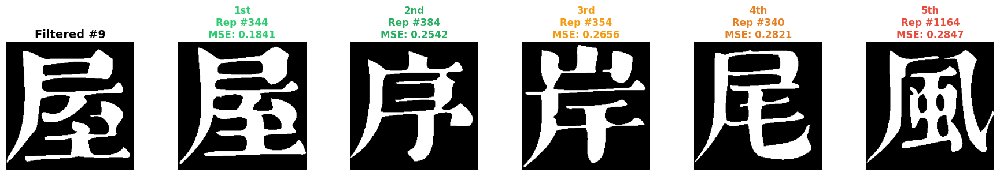


Top 5 representatives for filtered image #9:
  1. Rep #344: MSE = 0.184097
  2. Rep #384: MSE = 0.254227
  3. Rep #354: MSE = 0.265625
  4. Rep #340: MSE = 0.282120
  5. Rep #1164: MSE = 0.284714

  MSE spread (5th - 1st): 0.100616
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #10, 'q' to quit:  



IMAGE #10 (showing filtered + top 5 reps)


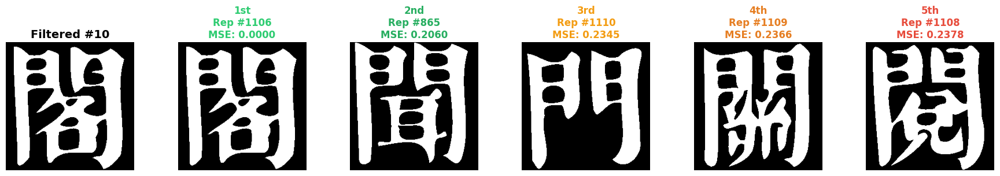


Top 5 representatives for filtered image #10:
  1. Rep #1106: MSE = 0.000000
  2. Rep #865: MSE = 0.205963
  3. Rep #1110: MSE = 0.234482
  4. Rep #1109: MSE = 0.236588
  5. Rep #1108: MSE = 0.237808

  MSE spread (5th - 1st): 0.237808
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #11, 'q' to quit:  



IMAGE #11 (showing filtered + top 5 reps)


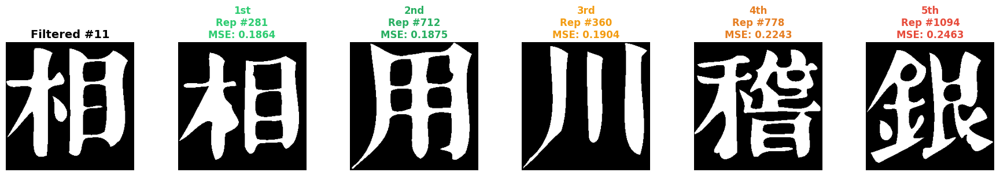


Top 5 representatives for filtered image #11:
  1. Rep #281: MSE = 0.186386
  2. Rep #712: MSE = 0.187546
  3. Rep #360: MSE = 0.190353
  4. Rep #778: MSE = 0.224350
  5. Rep #1094: MSE = 0.246277

  MSE spread (5th - 1st): 0.059891



Press Enter for image #12, 'q' to quit:  



IMAGE #12 (showing filtered + top 5 reps)


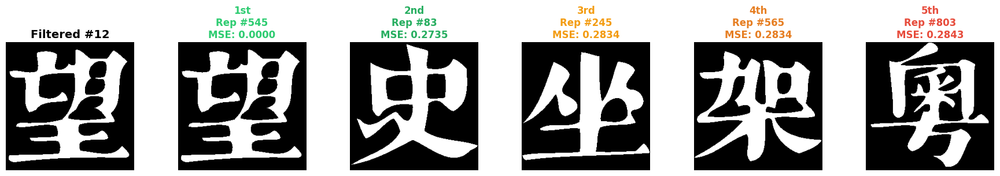


Top 5 representatives for filtered image #12:
  1. Rep #545: MSE = 0.000000
  2. Rep #83: MSE = 0.273514
  3. Rep #245: MSE = 0.283356
  4. Rep #565: MSE = 0.283371
  5. Rep #803: MSE = 0.284302

  MSE spread (5th - 1st): 0.284302
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #13, 'q' to quit:  



IMAGE #13 (showing filtered + top 5 reps)


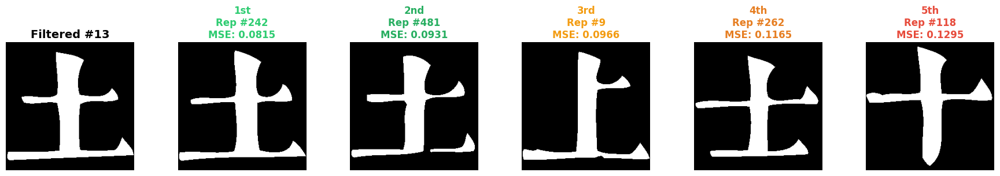


Top 5 representatives for filtered image #13:
  1. Rep #242: MSE = 0.081451
  2. Rep #481: MSE = 0.093094
  3. Rep #9: MSE = 0.096603
  4. Rep #262: MSE = 0.116547
  5. Rep #118: MSE = 0.129456

  MSE spread (5th - 1st): 0.048004



Press Enter for image #14, 'q' to quit:  



IMAGE #14 (showing filtered + top 5 reps)


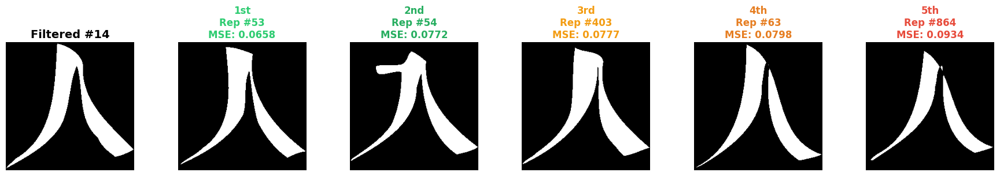


Top 5 representatives for filtered image #14:
  1. Rep #53: MSE = 0.065842
  2. Rep #54: MSE = 0.077209
  3. Rep #403: MSE = 0.077728
  4. Rep #63: MSE = 0.079819
  5. Rep #864: MSE = 0.093414

  MSE spread (5th - 1st): 0.027573



Press Enter for image #15, 'q' to quit:  



IMAGE #15 (showing filtered + top 5 reps)


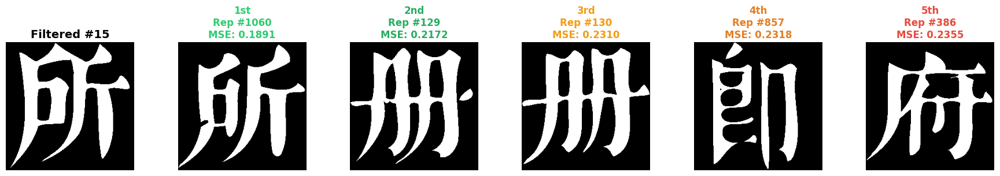


Top 5 representatives for filtered image #15:
  1. Rep #1060: MSE = 0.189087
  2. Rep #129: MSE = 0.217178
  3. Rep #130: MSE = 0.231049
  4. Rep #857: MSE = 0.231796
  5. Rep #386: MSE = 0.235458

  MSE spread (5th - 1st): 0.046371



Press Enter for image #16, 'q' to quit:  



IMAGE #16 (showing filtered + top 5 reps)


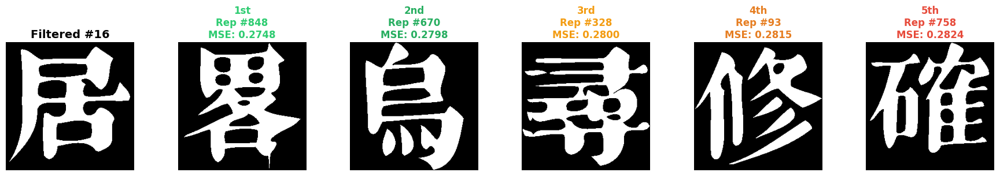


Top 5 representatives for filtered image #16:
  1. Rep #848: MSE = 0.274765
  2. Rep #670: MSE = 0.279816
  3. Rep #328: MSE = 0.279953
  4. Rep #93: MSE = 0.281509
  5. Rep #758: MSE = 0.282364

  MSE spread (5th - 1st): 0.007599
  → CLOSE CALL: Small difference between candidates



Press Enter for image #17, 'q' to quit:  



IMAGE #17 (showing filtered + top 5 reps)


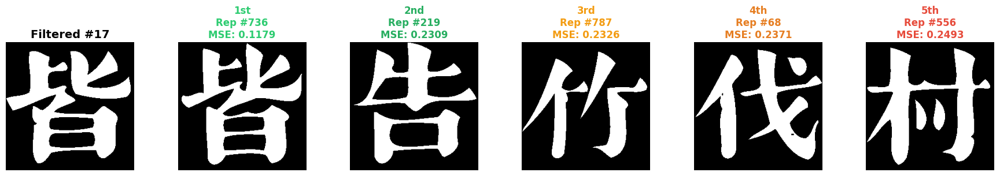


Top 5 representatives for filtered image #17:
  1. Rep #736: MSE = 0.117935
  2. Rep #219: MSE = 0.230881
  3. Rep #787: MSE = 0.232590
  4. Rep #68: MSE = 0.237106
  5. Rep #556: MSE = 0.249329

  MSE spread (5th - 1st): 0.131393
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #18, 'q' to quit:  



IMAGE #18 (showing filtered + top 5 reps)


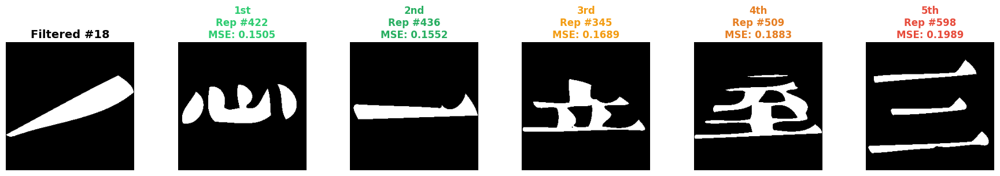


Top 5 representatives for filtered image #18:
  1. Rep #422: MSE = 0.150452
  2. Rep #436: MSE = 0.155197
  3. Rep #345: MSE = 0.168900
  4. Rep #509: MSE = 0.188324
  5. Rep #598: MSE = 0.198868

  MSE spread (5th - 1st): 0.048416



Press Enter for image #19, 'q' to quit:  



IMAGE #19 (showing filtered + top 5 reps)


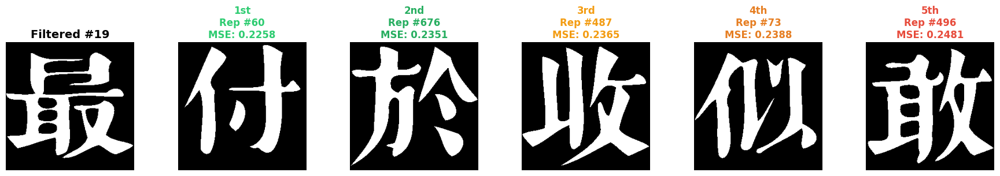


Top 5 representatives for filtered image #19:
  1. Rep #60: MSE = 0.225784
  2. Rep #676: MSE = 0.235107
  3. Rep #487: MSE = 0.236450
  4. Rep #73: MSE = 0.238831
  5. Rep #496: MSE = 0.248123

  MSE spread (5th - 1st): 0.022339



Press Enter for image #20, 'q' to quit:  



IMAGE #20 (showing filtered + top 5 reps)


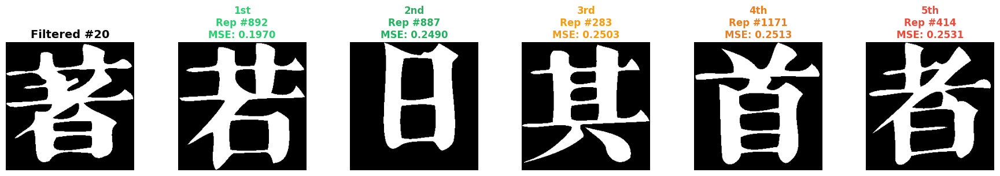


Top 5 representatives for filtered image #20:
  1. Rep #892: MSE = 0.196960
  2. Rep #887: MSE = 0.248978
  3. Rep #283: MSE = 0.250320
  4. Rep #1171: MSE = 0.251297
  5. Rep #414: MSE = 0.253052

  MSE spread (5th - 1st): 0.056091



Press Enter for image #21, 'q' to quit:  



IMAGE #21 (showing filtered + top 5 reps)


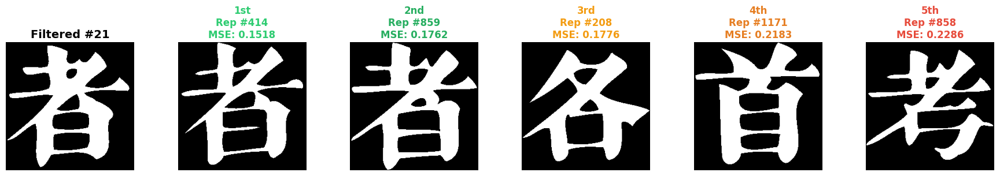


Top 5 representatives for filtered image #21:
  1. Rep #414: MSE = 0.151840
  2. Rep #859: MSE = 0.176178
  3. Rep #208: MSE = 0.177551
  4. Rep #1171: MSE = 0.218262
  5. Rep #858: MSE = 0.228622

  MSE spread (5th - 1st): 0.076782



Press Enter for image #22, 'q' to quit:  



IMAGE #22 (showing filtered + top 5 reps)


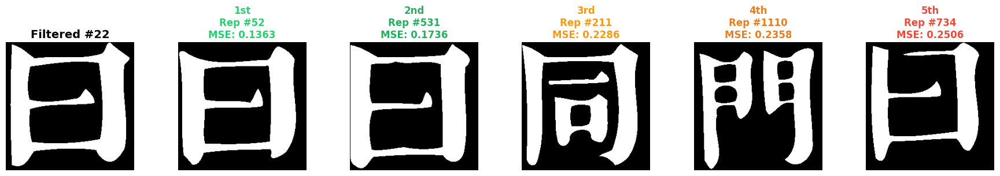


Top 5 representatives for filtered image #22:
  1. Rep #52: MSE = 0.136307
  2. Rep #531: MSE = 0.173553
  3. Rep #211: MSE = 0.228638
  4. Rep #1110: MSE = 0.235840
  5. Rep #734: MSE = 0.250626

  MSE spread (5th - 1st): 0.114319
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #23, 'q' to quit:  



IMAGE #23 (showing filtered + top 5 reps)


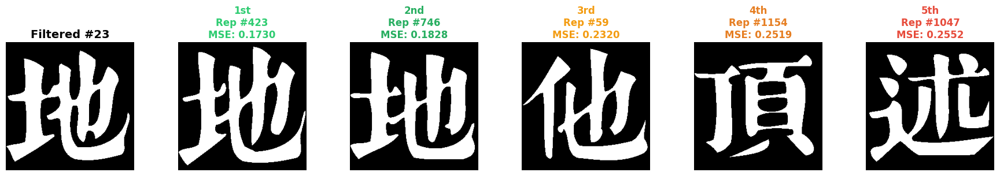


Top 5 representatives for filtered image #23:
  1. Rep #423: MSE = 0.172989
  2. Rep #746: MSE = 0.182846
  3. Rep #59: MSE = 0.232010
  4. Rep #1154: MSE = 0.251938
  5. Rep #1047: MSE = 0.255249

  MSE spread (5th - 1st): 0.082260



Press Enter for image #24, 'q' to quit:  



IMAGE #24 (showing filtered + top 5 reps)


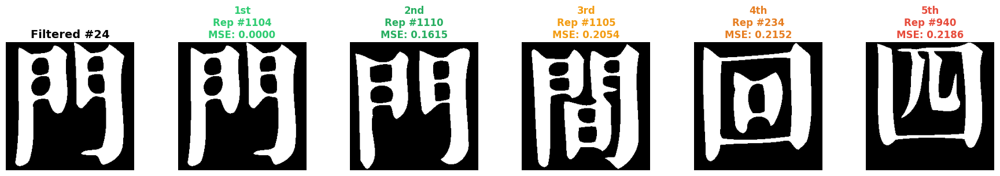


Top 5 representatives for filtered image #24:
  1. Rep #1104: MSE = 0.000000
  2. Rep #1110: MSE = 0.161514
  3. Rep #1105: MSE = 0.205444
  4. Rep #234: MSE = 0.215225
  5. Rep #940: MSE = 0.218582

  MSE spread (5th - 1st): 0.218582
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #25, 'q' to quit:  



IMAGE #25 (showing filtered + top 5 reps)


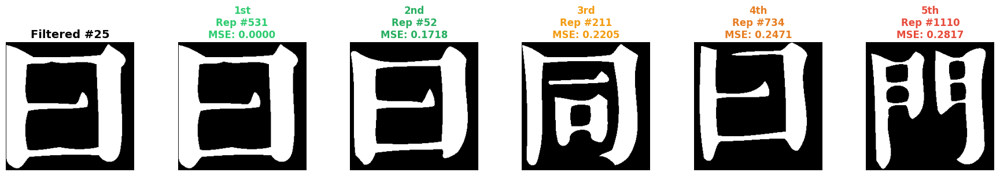


Top 5 representatives for filtered image #25:
  1. Rep #531: MSE = 0.000000
  2. Rep #52: MSE = 0.171799
  3. Rep #211: MSE = 0.220520
  4. Rep #734: MSE = 0.247147
  5. Rep #1110: MSE = 0.281708

  MSE spread (5th - 1st): 0.281708
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #26, 'q' to quit:  



IMAGE #26 (showing filtered + top 5 reps)


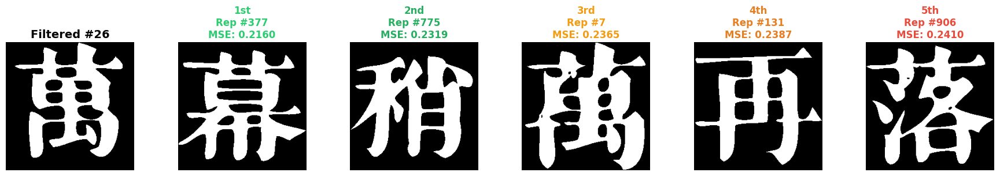


Top 5 representatives for filtered image #26:
  1. Rep #377: MSE = 0.215958
  2. Rep #775: MSE = 0.231949
  3. Rep #7: MSE = 0.236496
  4. Rep #131: MSE = 0.238739
  5. Rep #906: MSE = 0.241043

  MSE spread (5th - 1st): 0.025085



Press Enter for image #27, 'q' to quit:  



IMAGE #27 (showing filtered + top 5 reps)


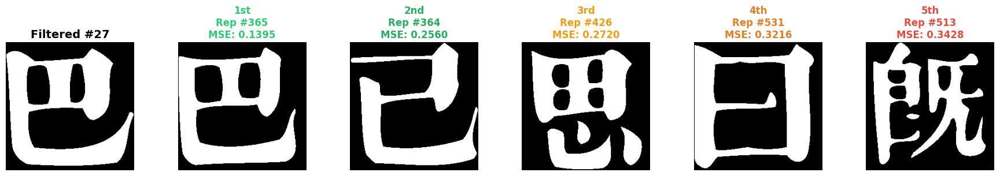


Top 5 representatives for filtered image #27:
  1. Rep #365: MSE = 0.139465
  2. Rep #364: MSE = 0.255966
  3. Rep #426: MSE = 0.272034
  4. Rep #531: MSE = 0.321625
  5. Rep #513: MSE = 0.342850

  MSE spread (5th - 1st): 0.203384
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #28, 'q' to quit:  



IMAGE #28 (showing filtered + top 5 reps)


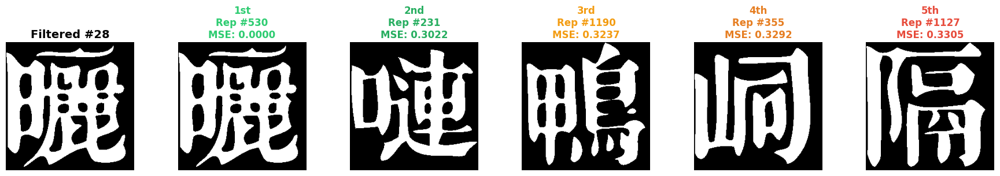


Top 5 representatives for filtered image #28:
  1. Rep #530: MSE = 0.000000
  2. Rep #231: MSE = 0.302155
  3. Rep #1190: MSE = 0.323746
  4. Rep #355: MSE = 0.329239
  5. Rep #1127: MSE = 0.330490

  MSE spread (5th - 1st): 0.330490
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #29, 'q' to quit:  



IMAGE #29 (showing filtered + top 5 reps)


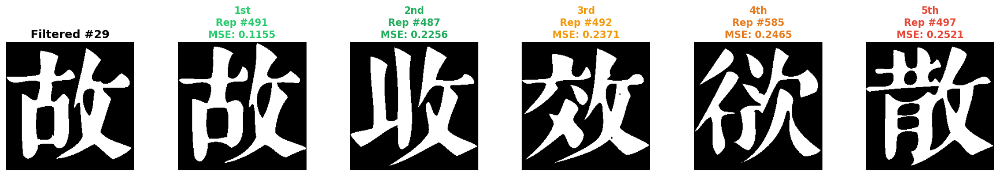


Top 5 representatives for filtered image #29:
  1. Rep #491: MSE = 0.115524
  2. Rep #487: MSE = 0.225555
  3. Rep #492: MSE = 0.237091
  4. Rep #585: MSE = 0.246536
  5. Rep #497: MSE = 0.252060

  MSE spread (5th - 1st): 0.136536
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #30, 'q' to quit:  



IMAGE #30 (showing filtered + top 5 reps)


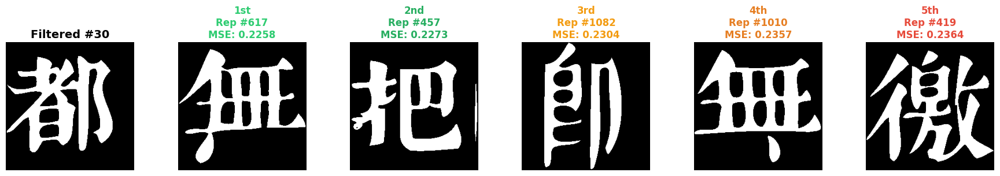


Top 5 representatives for filtered image #30:
  1. Rep #617: MSE = 0.225815
  2. Rep #457: MSE = 0.227310
  3. Rep #1082: MSE = 0.230392
  4. Rep #1010: MSE = 0.235672
  5. Rep #419: MSE = 0.236389

  MSE spread (5th - 1st): 0.010574
  → CLOSE CALL: Small difference between candidates



Press Enter for image #31, 'q' to quit:  



IMAGE #31 (showing filtered + top 5 reps)


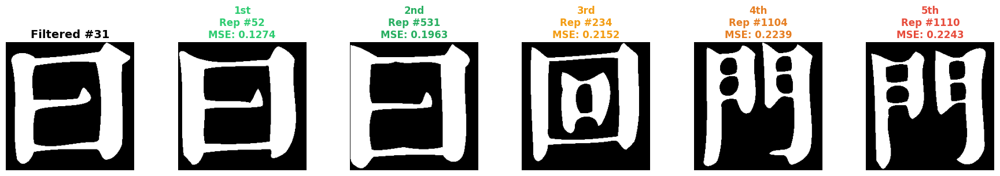


Top 5 representatives for filtered image #31:
  1. Rep #52: MSE = 0.127365
  2. Rep #531: MSE = 0.196289
  3. Rep #234: MSE = 0.215240
  4. Rep #1104: MSE = 0.223892
  5. Rep #1110: MSE = 0.224335

  MSE spread (5th - 1st): 0.096970



Press Enter for image #32, 'q' to quit:  



IMAGE #32 (showing filtered + top 5 reps)


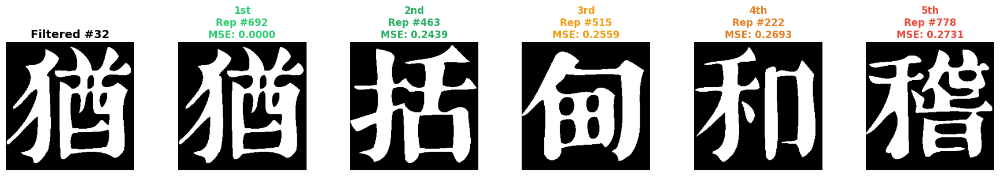


Top 5 representatives for filtered image #32:
  1. Rep #692: MSE = 0.000000
  2. Rep #463: MSE = 0.243942
  3. Rep #515: MSE = 0.255875
  4. Rep #222: MSE = 0.269287
  5. Rep #778: MSE = 0.273132

  MSE spread (5th - 1st): 0.273132
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #33, 'q' to quit:  



IMAGE #33 (showing filtered + top 5 reps)


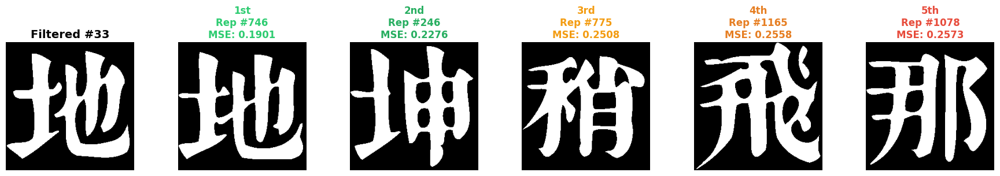


Top 5 representatives for filtered image #33:
  1. Rep #746: MSE = 0.190094
  2. Rep #246: MSE = 0.227600
  3. Rep #775: MSE = 0.250763
  4. Rep #1165: MSE = 0.255844
  5. Rep #1078: MSE = 0.257324

  MSE spread (5th - 1st): 0.067230



Press Enter for image #34, 'q' to quit:  



IMAGE #34 (showing filtered + top 5 reps)


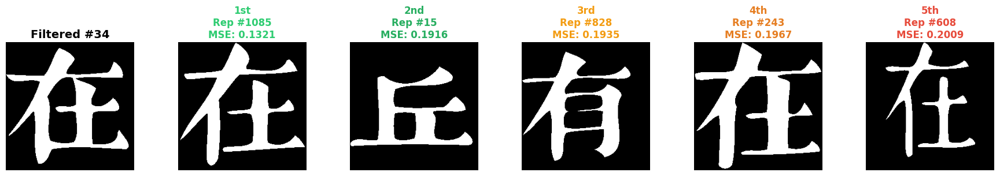


Top 5 representatives for filtered image #34:
  1. Rep #1085: MSE = 0.132080
  2. Rep #15: MSE = 0.191635
  3. Rep #828: MSE = 0.193481
  4. Rep #243: MSE = 0.196701
  5. Rep #608: MSE = 0.200882

  MSE spread (5th - 1st): 0.068802



Press Enter for image #35, 'q' to quit:  



IMAGE #35 (showing filtered + top 5 reps)


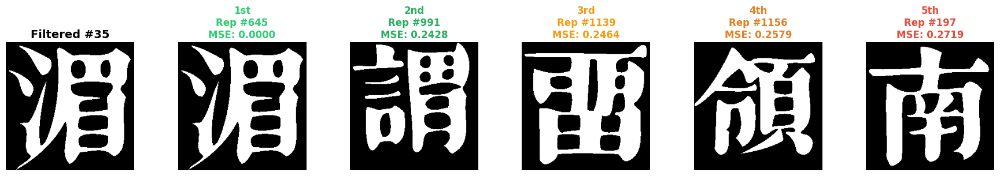


Top 5 representatives for filtered image #35:
  1. Rep #645: MSE = 0.000000
  2. Rep #991: MSE = 0.242844
  3. Rep #1139: MSE = 0.246445
  4. Rep #1156: MSE = 0.257935
  5. Rep #197: MSE = 0.271866

  MSE spread (5th - 1st): 0.271866
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #36, 'q' to quit:  



IMAGE #36 (showing filtered + top 5 reps)


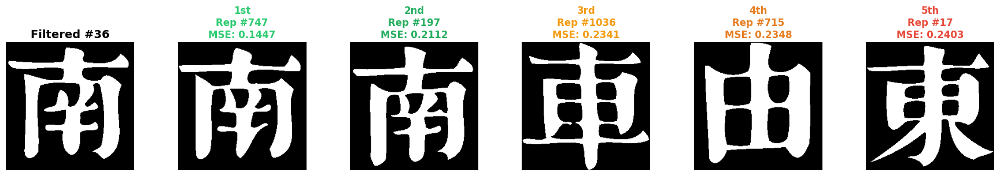


Top 5 representatives for filtered image #36:
  1. Rep #747: MSE = 0.144699
  2. Rep #197: MSE = 0.211197
  3. Rep #1036: MSE = 0.234146
  4. Rep #715: MSE = 0.234848
  5. Rep #17: MSE = 0.240311

  MSE spread (5th - 1st): 0.095612



Press Enter for image #37, 'q' to quit:  



IMAGE #37 (showing filtered + top 5 reps)


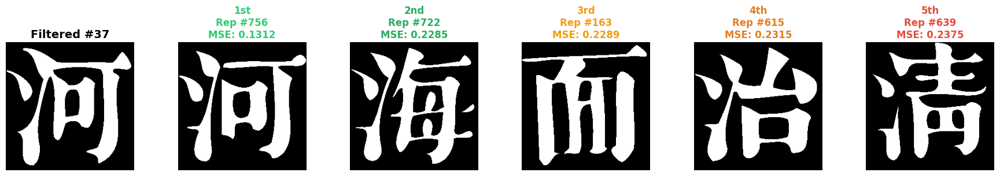


Top 5 representatives for filtered image #37:
  1. Rep #756: MSE = 0.131195
  2. Rep #722: MSE = 0.228516
  3. Rep #163: MSE = 0.228943
  4. Rep #615: MSE = 0.231461
  5. Rep #639: MSE = 0.237503

  MSE spread (5th - 1st): 0.106308
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #38, 'q' to quit:  



IMAGE #38 (showing filtered + top 5 reps)


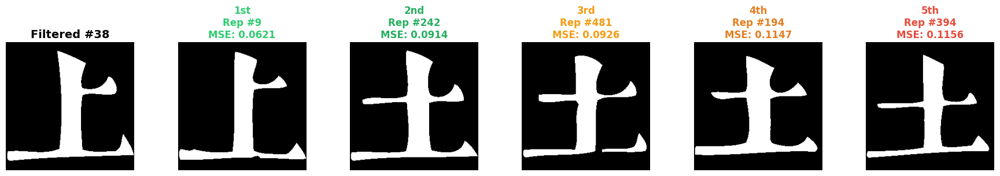


Top 5 representatives for filtered image #38:
  1. Rep #9: MSE = 0.062073
  2. Rep #242: MSE = 0.091415
  3. Rep #481: MSE = 0.092560
  4. Rep #194: MSE = 0.114731
  5. Rep #394: MSE = 0.115631

  MSE spread (5th - 1st): 0.053558



Press Enter for image #39, 'q' to quit:  



IMAGE #39 (showing filtered + top 5 reps)


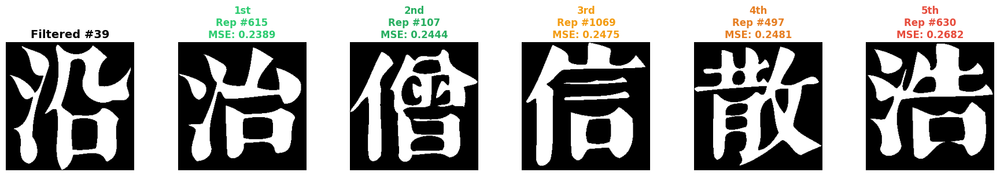


Top 5 representatives for filtered image #39:
  1. Rep #615: MSE = 0.238861
  2. Rep #107: MSE = 0.244370
  3. Rep #1069: MSE = 0.247452
  4. Rep #497: MSE = 0.248093
  5. Rep #630: MSE = 0.268188

  MSE spread (5th - 1st): 0.029327



Press Enter for image #40, 'q' to quit:  



IMAGE #40 (showing filtered + top 5 reps)


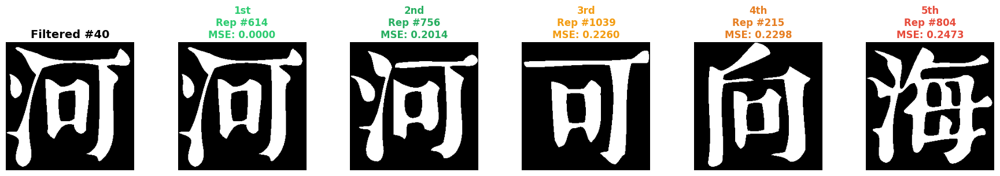


Top 5 representatives for filtered image #40:
  1. Rep #614: MSE = 0.000000
  2. Rep #756: MSE = 0.201370
  3. Rep #1039: MSE = 0.225967
  4. Rep #215: MSE = 0.229828
  5. Rep #804: MSE = 0.247299

  MSE spread (5th - 1st): 0.247299
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #41, 'q' to quit:  



IMAGE #41 (showing filtered + top 5 reps)


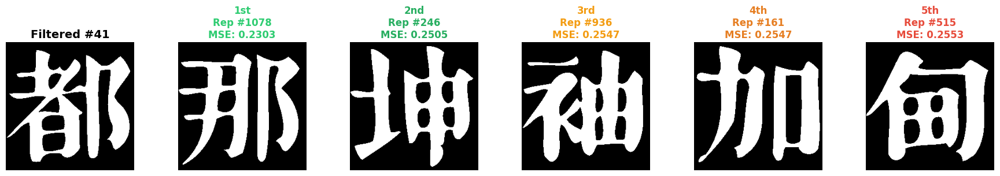


Top 5 representatives for filtered image #41:
  1. Rep #1078: MSE = 0.230347
  2. Rep #246: MSE = 0.250458
  3. Rep #936: MSE = 0.254715
  4. Rep #161: MSE = 0.254715
  5. Rep #515: MSE = 0.255280

  MSE spread (5th - 1st): 0.024933



Press Enter for image #42, 'q' to quit:  



IMAGE #42 (showing filtered + top 5 reps)


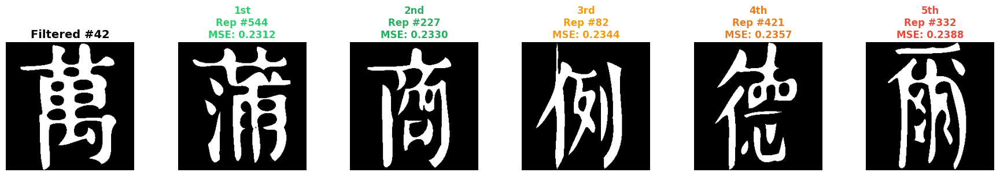


Top 5 representatives for filtered image #42:
  1. Rep #544: MSE = 0.231201
  2. Rep #227: MSE = 0.233002
  3. Rep #82: MSE = 0.234390
  4. Rep #421: MSE = 0.235657
  5. Rep #332: MSE = 0.238815

  MSE spread (5th - 1st): 0.007614
  → CLOSE CALL: Small difference between candidates



Press Enter for image #43, 'q' to quit:  



IMAGE #43 (showing filtered + top 5 reps)


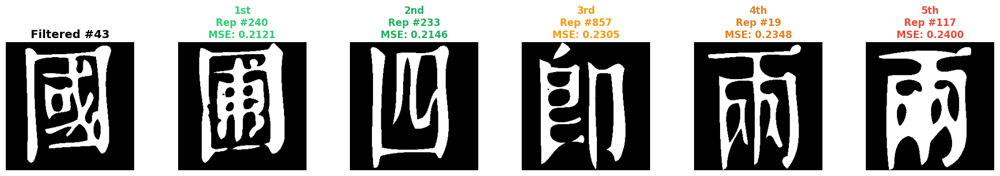


Top 5 representatives for filtered image #43:
  1. Rep #240: MSE = 0.212082
  2. Rep #233: MSE = 0.214630
  3. Rep #857: MSE = 0.230453
  4. Rep #19: MSE = 0.234787
  5. Rep #117: MSE = 0.239975

  MSE spread (5th - 1st): 0.027893



Press Enter for image #44, 'q' to quit:  



IMAGE #44 (showing filtered + top 5 reps)


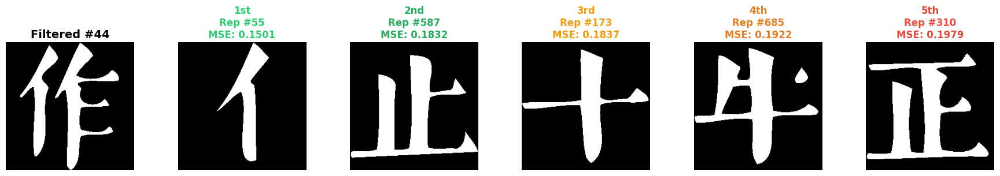


Top 5 representatives for filtered image #44:
  1. Rep #55: MSE = 0.150131
  2. Rep #587: MSE = 0.183167
  3. Rep #173: MSE = 0.183731
  4. Rep #685: MSE = 0.192215
  5. Rep #310: MSE = 0.197906

  MSE spread (5th - 1st): 0.047775



Press Enter for image #45, 'q' to quit:  



IMAGE #45 (showing filtered + top 5 reps)


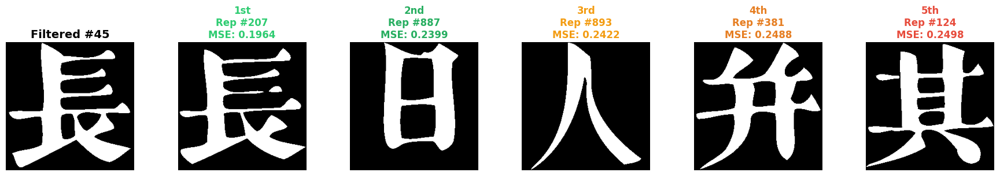


Top 5 representatives for filtered image #45:
  1. Rep #207: MSE = 0.196381
  2. Rep #887: MSE = 0.239899
  3. Rep #893: MSE = 0.242203
  4. Rep #381: MSE = 0.248810
  5. Rep #124: MSE = 0.249771

  MSE spread (5th - 1st): 0.053391



Press Enter for image #46, 'q' to quit:  



IMAGE #46 (showing filtered + top 5 reps)


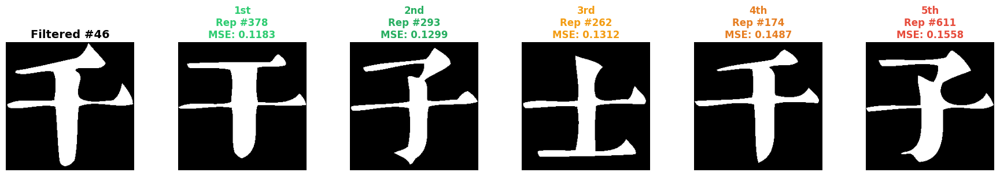


Top 5 representatives for filtered image #46:
  1. Rep #378: MSE = 0.118317
  2. Rep #293: MSE = 0.129898
  3. Rep #262: MSE = 0.131226
  4. Rep #174: MSE = 0.148651
  5. Rep #611: MSE = 0.155807

  MSE spread (5th - 1st): 0.037491



Press Enter for image #47, 'q' to quit:  



IMAGE #47 (showing filtered + top 5 reps)


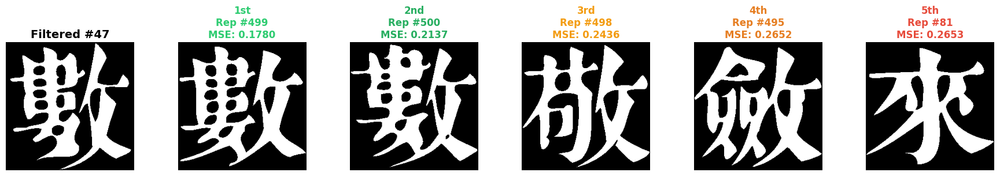


Top 5 representatives for filtered image #47:
  1. Rep #499: MSE = 0.177994
  2. Rep #500: MSE = 0.213669
  3. Rep #498: MSE = 0.243607
  4. Rep #495: MSE = 0.265244
  5. Rep #81: MSE = 0.265259

  MSE spread (5th - 1st): 0.087265



Press Enter for image #48, 'q' to quit:  



IMAGE #48 (showing filtered + top 5 reps)


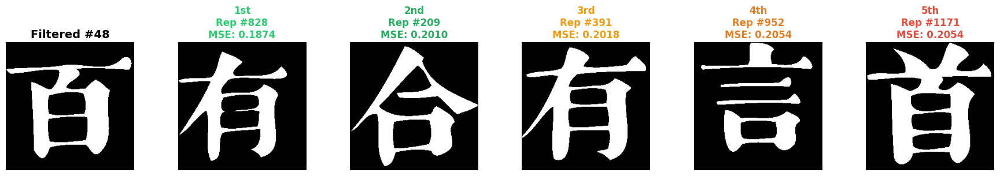


Top 5 representatives for filtered image #48:
  1. Rep #828: MSE = 0.187393
  2. Rep #209: MSE = 0.201050
  3. Rep #391: MSE = 0.201752
  4. Rep #952: MSE = 0.205399
  5. Rep #1171: MSE = 0.205414

  MSE spread (5th - 1st): 0.018021
  → CLOSE CALL: Small difference between candidates



Press Enter for image #49, 'q' to quit:  



IMAGE #49 (showing filtered + top 5 reps)


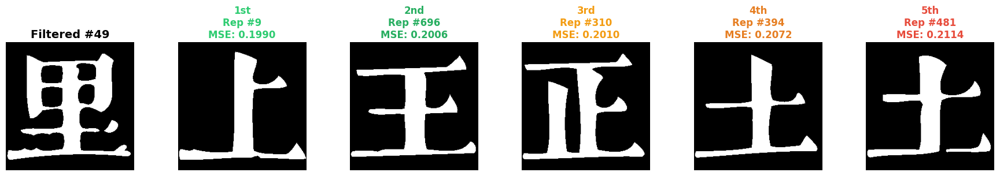


Top 5 representatives for filtered image #49:
  1. Rep #9: MSE = 0.198959
  2. Rep #696: MSE = 0.200592
  3. Rep #310: MSE = 0.201050
  4. Rep #394: MSE = 0.207230
  5. Rep #481: MSE = 0.211380

  MSE spread (5th - 1st): 0.012421
  → CLOSE CALL: Small difference between candidates



Press Enter for image #50, 'q' to quit:  



IMAGE #50 (showing filtered + top 5 reps)


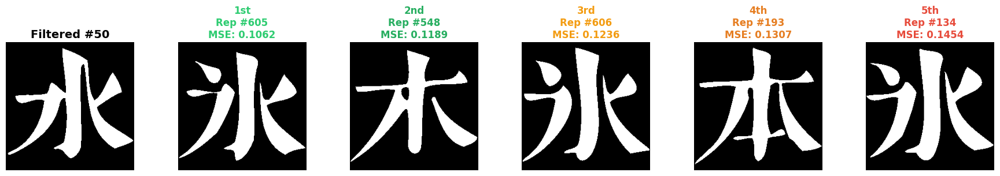


Top 5 representatives for filtered image #50:
  1. Rep #605: MSE = 0.106201
  2. Rep #548: MSE = 0.118851
  3. Rep #606: MSE = 0.123550
  4. Rep #193: MSE = 0.130692
  5. Rep #134: MSE = 0.145386

  MSE spread (5th - 1st): 0.039185



Press Enter for image #51, 'q' to quit:  



IMAGE #51 (showing filtered + top 5 reps)


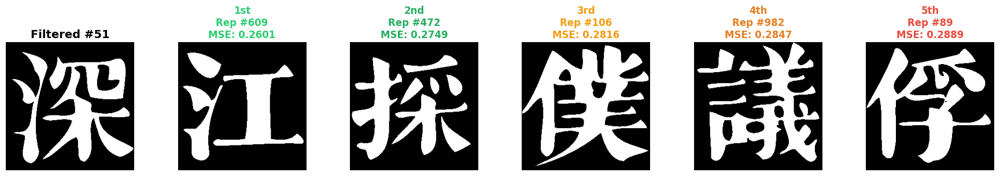


Top 5 representatives for filtered image #51:
  1. Rep #609: MSE = 0.260071
  2. Rep #472: MSE = 0.274887
  3. Rep #106: MSE = 0.281555
  4. Rep #982: MSE = 0.284729
  5. Rep #89: MSE = 0.288895

  MSE spread (5th - 1st): 0.028824



Press Enter for image #52, 'q' to quit:  



IMAGE #52 (showing filtered + top 5 reps)


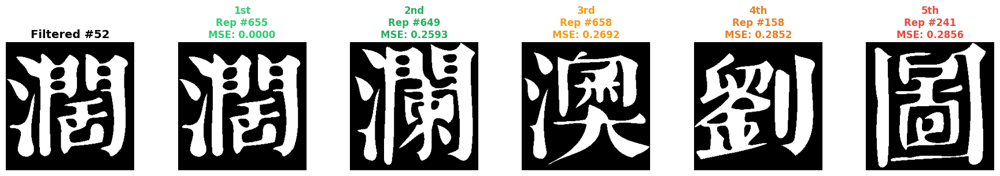


Top 5 representatives for filtered image #52:
  1. Rep #655: MSE = 0.000000
  2. Rep #649: MSE = 0.259308
  3. Rep #658: MSE = 0.269226
  4. Rep #158: MSE = 0.285217
  5. Rep #241: MSE = 0.285629

  MSE spread (5th - 1st): 0.285629
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #53, 'q' to quit:  



IMAGE #53 (showing filtered + top 5 reps)


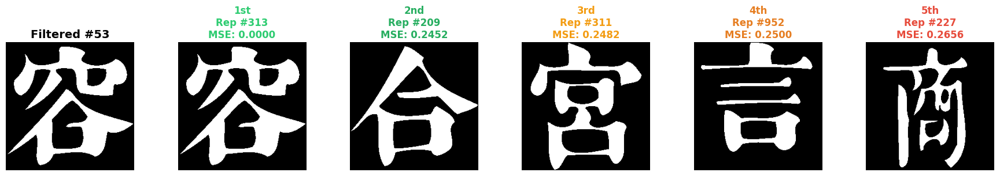


Top 5 representatives for filtered image #53:
  1. Rep #313: MSE = 0.000000
  2. Rep #209: MSE = 0.245239
  3. Rep #311: MSE = 0.248154
  4. Rep #952: MSE = 0.249985
  5. Rep #227: MSE = 0.265625

  MSE spread (5th - 1st): 0.265625
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #54, 'q' to quit:  



IMAGE #54 (showing filtered + top 5 reps)


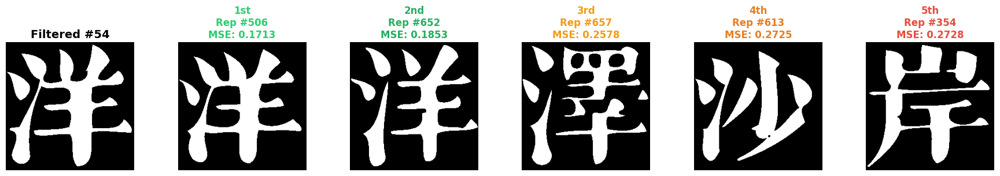


Top 5 representatives for filtered image #54:
  1. Rep #506: MSE = 0.171265
  2. Rep #652: MSE = 0.185287
  3. Rep #657: MSE = 0.257828
  4. Rep #613: MSE = 0.272522
  5. Rep #354: MSE = 0.272766

  MSE spread (5th - 1st): 0.101501
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #55, 'q' to quit:  



IMAGE #55 (showing filtered + top 5 reps)


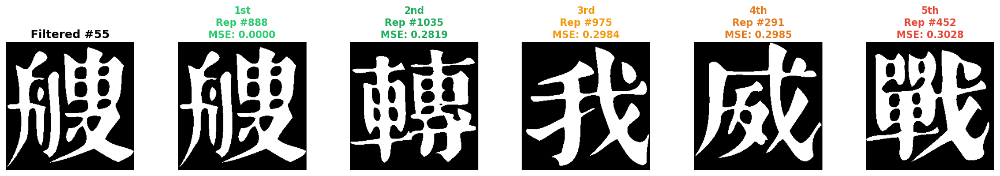


Top 5 representatives for filtered image #55:
  1. Rep #888: MSE = 0.000000
  2. Rep #1035: MSE = 0.281876
  3. Rep #975: MSE = 0.298447
  4. Rep #291: MSE = 0.298477
  5. Rep #452: MSE = 0.302765

  MSE spread (5th - 1st): 0.302765
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #56, 'q' to quit:  



IMAGE #56 (showing filtered + top 5 reps)


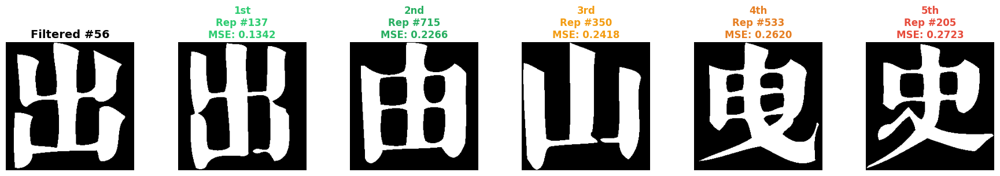


Top 5 representatives for filtered image #56:
  1. Rep #137: MSE = 0.134247
  2. Rep #715: MSE = 0.226624
  3. Rep #350: MSE = 0.241837
  4. Rep #533: MSE = 0.261963
  5. Rep #205: MSE = 0.272293

  MSE spread (5th - 1st): 0.138046
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #57, 'q' to quit:  



IMAGE #57 (showing filtered + top 5 reps)


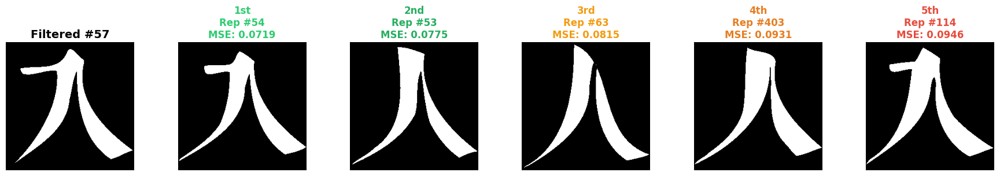


Top 5 representatives for filtered image #57:
  1. Rep #54: MSE = 0.071945
  2. Rep #53: MSE = 0.077545
  3. Rep #63: MSE = 0.081543
  4. Rep #403: MSE = 0.093094
  5. Rep #114: MSE = 0.094620

  MSE spread (5th - 1st): 0.022675



Press Enter for image #58, 'q' to quit:  



IMAGE #58 (showing filtered + top 5 reps)


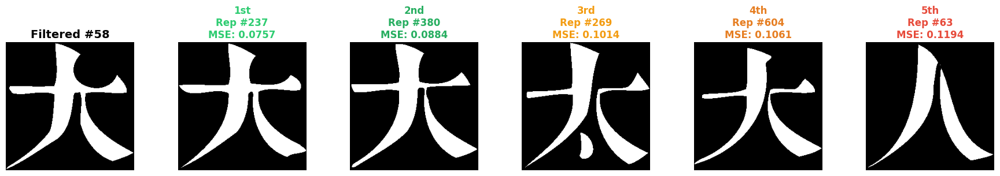


Top 5 representatives for filtered image #58:
  1. Rep #237: MSE = 0.075699
  2. Rep #380: MSE = 0.088409
  3. Rep #269: MSE = 0.101440
  4. Rep #604: MSE = 0.106079
  5. Rep #63: MSE = 0.119385

  MSE spread (5th - 1st): 0.043686



Press Enter for image #59, 'q' to quit:  



IMAGE #59 (showing filtered + top 5 reps)


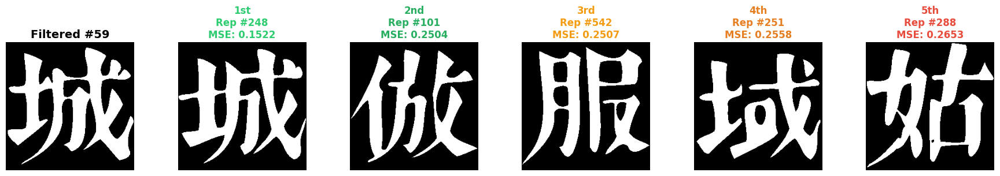


Top 5 representatives for filtered image #59:
  1. Rep #248: MSE = 0.152161
  2. Rep #101: MSE = 0.250366
  3. Rep #542: MSE = 0.250717
  4. Rep #251: MSE = 0.255768
  5. Rep #288: MSE = 0.265259

  MSE spread (5th - 1st): 0.113098
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #60, 'q' to quit:  



IMAGE #60 (showing filtered + top 5 reps)


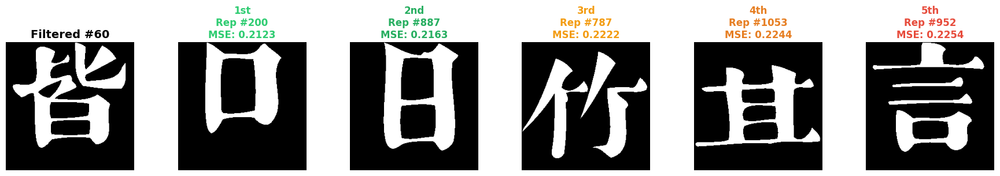


Top 5 representatives for filtered image #60:
  1. Rep #200: MSE = 0.212326
  2. Rep #887: MSE = 0.216339
  3. Rep #787: MSE = 0.222229
  4. Rep #1053: MSE = 0.224380
  5. Rep #952: MSE = 0.225357

  MSE spread (5th - 1st): 0.013031
  → CLOSE CALL: Small difference between candidates



Press Enter for image #61, 'q' to quit:  



IMAGE #61 (showing filtered + top 5 reps)


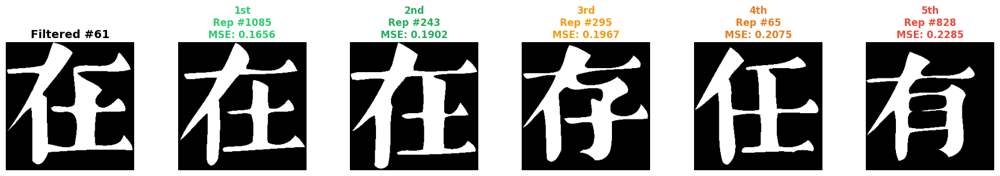


Top 5 representatives for filtered image #61:
  1. Rep #1085: MSE = 0.165649
  2. Rep #243: MSE = 0.190201
  3. Rep #295: MSE = 0.196716
  4. Rep #65: MSE = 0.207474
  5. Rep #828: MSE = 0.228516

  MSE spread (5th - 1st): 0.062866



Press Enter for image #62, 'q' to quit:  



IMAGE #62 (showing filtered + top 5 reps)


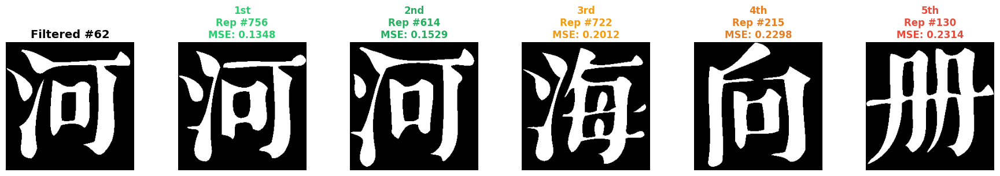


Top 5 representatives for filtered image #62:
  1. Rep #756: MSE = 0.134796
  2. Rep #614: MSE = 0.152878
  3. Rep #722: MSE = 0.201202
  4. Rep #215: MSE = 0.229782
  5. Rep #130: MSE = 0.231384

  MSE spread (5th - 1st): 0.096588



Press Enter for image #63, 'q' to quit:  



IMAGE #63 (showing filtered + top 5 reps)


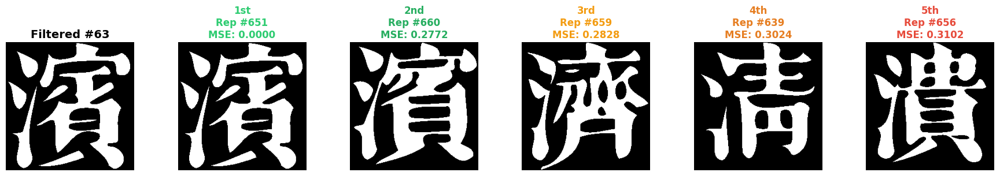


Top 5 representatives for filtered image #63:
  1. Rep #651: MSE = 0.000000
  2. Rep #660: MSE = 0.277237
  3. Rep #659: MSE = 0.282761
  4. Rep #639: MSE = 0.302399
  5. Rep #656: MSE = 0.310211

  MSE spread (5th - 1st): 0.310211
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #64, 'q' to quit:  



IMAGE #64 (showing filtered + top 5 reps)


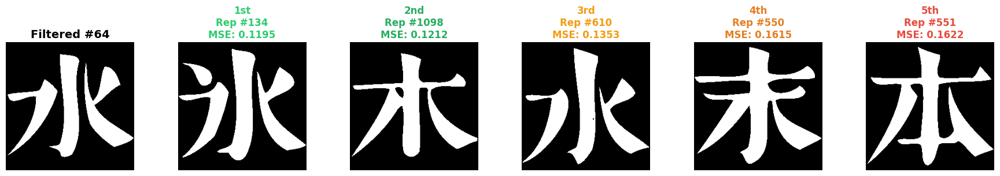


Top 5 representatives for filtered image #64:
  1. Rep #134: MSE = 0.119522
  2. Rep #1098: MSE = 0.121231
  3. Rep #610: MSE = 0.135345
  4. Rep #550: MSE = 0.161453
  5. Rep #551: MSE = 0.162155

  MSE spread (5th - 1st): 0.042633



Press Enter for image #65, 'q' to quit:  



IMAGE #65 (showing filtered + top 5 reps)


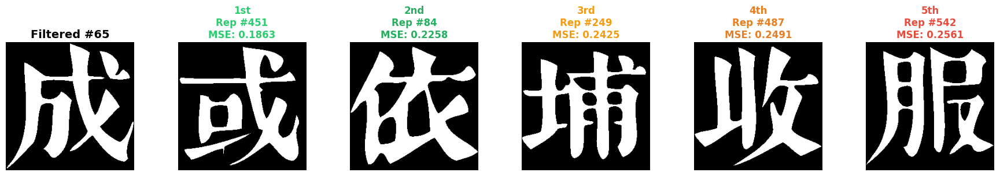


Top 5 representatives for filtered image #65:
  1. Rep #451: MSE = 0.186264
  2. Rep #84: MSE = 0.225769
  3. Rep #249: MSE = 0.242477
  4. Rep #487: MSE = 0.249054
  5. Rep #542: MSE = 0.256073

  MSE spread (5th - 1st): 0.069809



Press Enter for image #66, 'q' to quit:  



IMAGE #66 (showing filtered + top 5 reps)


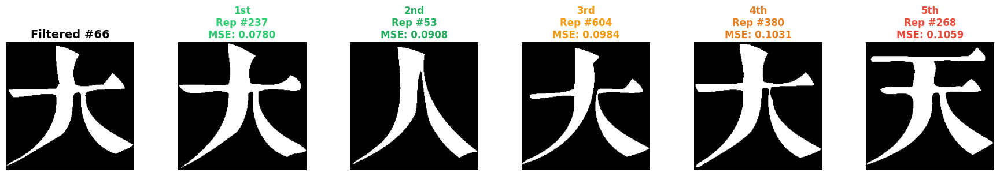


Top 5 representatives for filtered image #66:
  1. Rep #237: MSE = 0.077988
  2. Rep #53: MSE = 0.090759
  3. Rep #604: MSE = 0.098389
  4. Rep #380: MSE = 0.103149
  5. Rep #268: MSE = 0.105896

  MSE spread (5th - 1st): 0.027908



Press Enter for image #67, 'q' to quit:  



IMAGE #67 (showing filtered + top 5 reps)


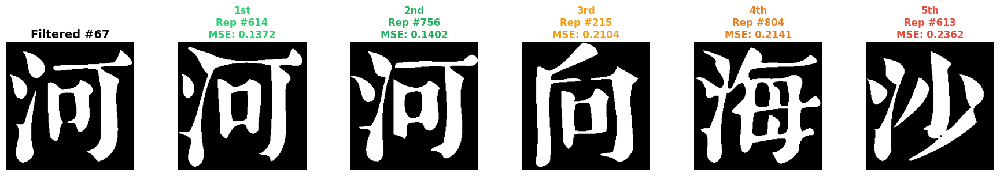


Top 5 representatives for filtered image #67:
  1. Rep #614: MSE = 0.137222
  2. Rep #756: MSE = 0.140228
  3. Rep #215: MSE = 0.210373
  4. Rep #804: MSE = 0.214081
  5. Rep #613: MSE = 0.236237

  MSE spread (5th - 1st): 0.099014



Press Enter for image #68, 'q' to quit:  



IMAGE #68 (showing filtered + top 5 reps)


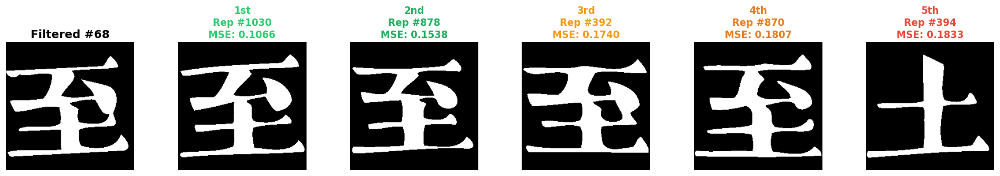


Top 5 representatives for filtered image #68:
  1. Rep #1030: MSE = 0.106583
  2. Rep #878: MSE = 0.153763
  3. Rep #392: MSE = 0.174042
  4. Rep #870: MSE = 0.180664
  5. Rep #394: MSE = 0.183289

  MSE spread (5th - 1st): 0.076706



Press Enter for image #69, 'q' to quit:  



IMAGE #69 (showing filtered + top 5 reps)


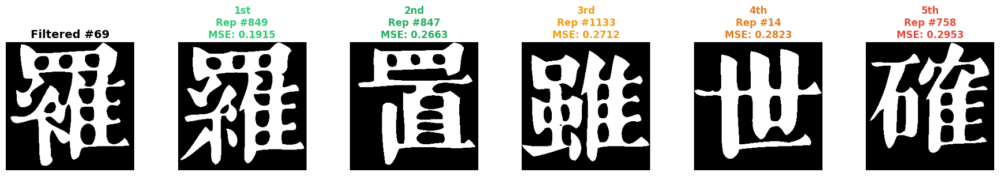


Top 5 representatives for filtered image #69:
  1. Rep #849: MSE = 0.191483
  2. Rep #847: MSE = 0.266251
  3. Rep #1133: MSE = 0.271240
  4. Rep #14: MSE = 0.282257
  5. Rep #758: MSE = 0.295273

  MSE spread (5th - 1st): 0.103790
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #70, 'q' to quit:  



IMAGE #70 (showing filtered + top 5 reps)


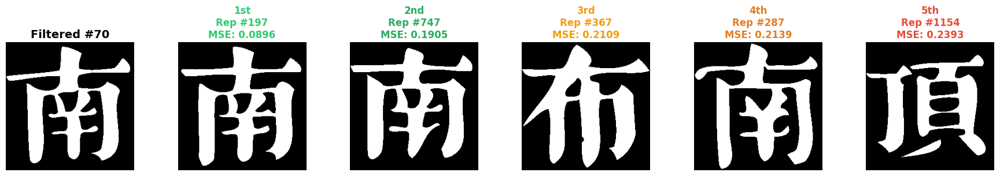


Top 5 representatives for filtered image #70:
  1. Rep #197: MSE = 0.089630
  2. Rep #747: MSE = 0.190460
  3. Rep #367: MSE = 0.210861
  4. Rep #287: MSE = 0.213898
  5. Rep #1154: MSE = 0.239349

  MSE spread (5th - 1st): 0.149719
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #71, 'q' to quit:  



IMAGE #71 (showing filtered + top 5 reps)


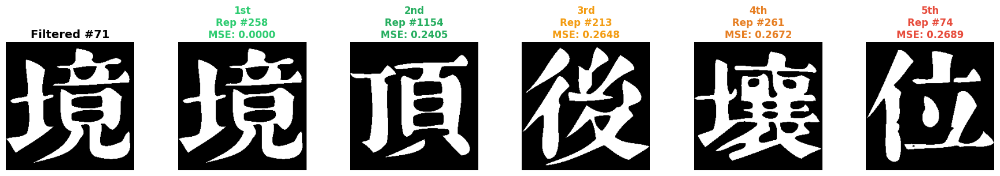


Top 5 representatives for filtered image #71:
  1. Rep #258: MSE = 0.000000
  2. Rep #1154: MSE = 0.240463
  3. Rep #213: MSE = 0.264771
  4. Rep #261: MSE = 0.267227
  5. Rep #74: MSE = 0.268875

  MSE spread (5th - 1st): 0.268875
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #72, 'q' to quit:  



IMAGE #72 (showing filtered + top 5 reps)


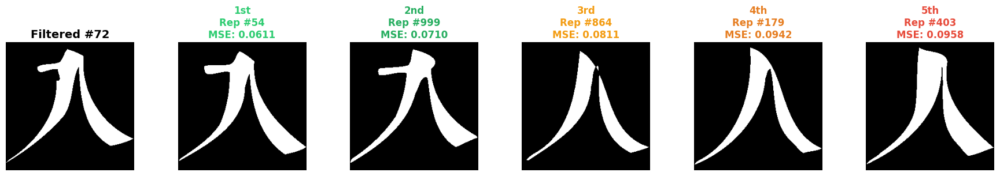


Top 5 representatives for filtered image #72:
  1. Rep #54: MSE = 0.061081
  2. Rep #999: MSE = 0.070984
  3. Rep #864: MSE = 0.081131
  4. Rep #179: MSE = 0.094238
  5. Rep #403: MSE = 0.095779

  MSE spread (5th - 1st): 0.034698



Press Enter for image #73, 'q' to quit:  



IMAGE #73 (showing filtered + top 5 reps)


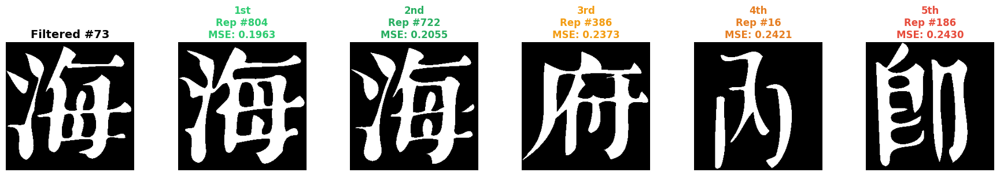


Top 5 representatives for filtered image #73:
  1. Rep #804: MSE = 0.196274
  2. Rep #722: MSE = 0.205490
  3. Rep #386: MSE = 0.237335
  4. Rep #16: MSE = 0.242126
  5. Rep #186: MSE = 0.242996

  MSE spread (5th - 1st): 0.046722



Press Enter for image #74, 'q' to quit:  



IMAGE #74 (showing filtered + top 5 reps)


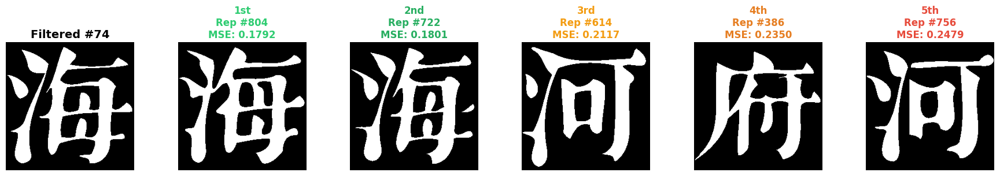


Top 5 representatives for filtered image #74:
  1. Rep #804: MSE = 0.179169
  2. Rep #722: MSE = 0.180115
  3. Rep #614: MSE = 0.211746
  4. Rep #386: MSE = 0.235031
  5. Rep #756: MSE = 0.247894

  MSE spread (5th - 1st): 0.068726



Press Enter for image #75, 'q' to quit:  



IMAGE #75 (showing filtered + top 5 reps)


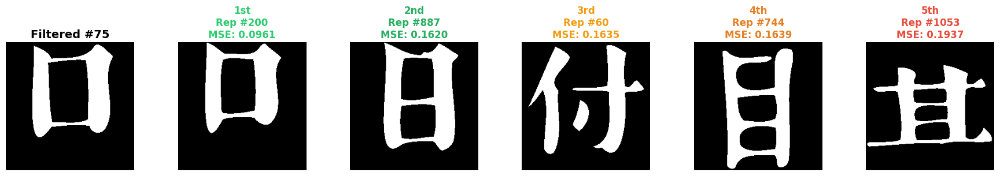


Top 5 representatives for filtered image #75:
  1. Rep #200: MSE = 0.096115
  2. Rep #887: MSE = 0.161987
  3. Rep #60: MSE = 0.163483
  4. Rep #744: MSE = 0.163925
  5. Rep #1053: MSE = 0.193680

  MSE spread (5th - 1st): 0.097565



Press Enter for image #76, 'q' to quit:  



IMAGE #76 (showing filtered + top 5 reps)


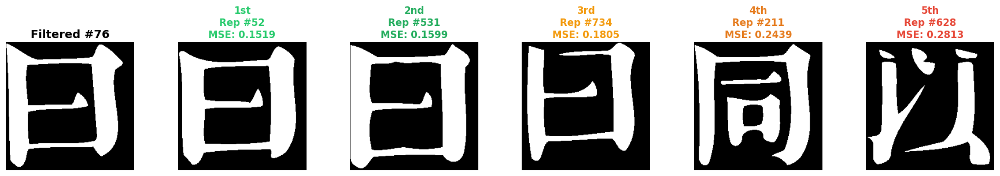


Top 5 representatives for filtered image #76:
  1. Rep #52: MSE = 0.151917
  2. Rep #531: MSE = 0.159897
  3. Rep #734: MSE = 0.180542
  4. Rep #211: MSE = 0.243912
  5. Rep #628: MSE = 0.281265

  MSE spread (5th - 1st): 0.129349
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #77, 'q' to quit:  



IMAGE #77 (showing filtered + top 5 reps)


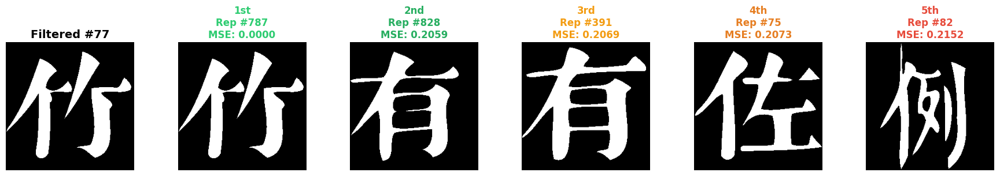


Top 5 representatives for filtered image #77:
  1. Rep #787: MSE = 0.000000
  2. Rep #828: MSE = 0.205948
  3. Rep #391: MSE = 0.206909
  4. Rep #75: MSE = 0.207306
  5. Rep #82: MSE = 0.215164

  MSE spread (5th - 1st): 0.215164
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #78, 'q' to quit:  



IMAGE #78 (showing filtered + top 5 reps)


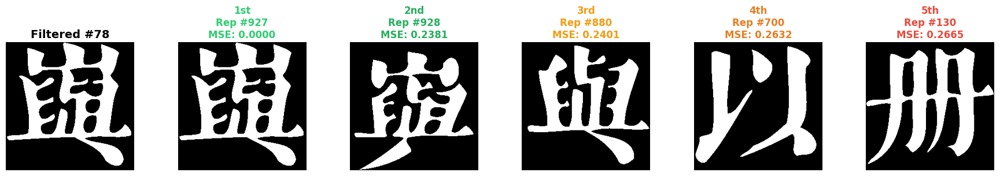


Top 5 representatives for filtered image #78:
  1. Rep #927: MSE = 0.000000
  2. Rep #928: MSE = 0.238068
  3. Rep #880: MSE = 0.240128
  4. Rep #700: MSE = 0.263199
  5. Rep #130: MSE = 0.266541

  MSE spread (5th - 1st): 0.266541
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #79, 'q' to quit:  



IMAGE #79 (showing filtered + top 5 reps)


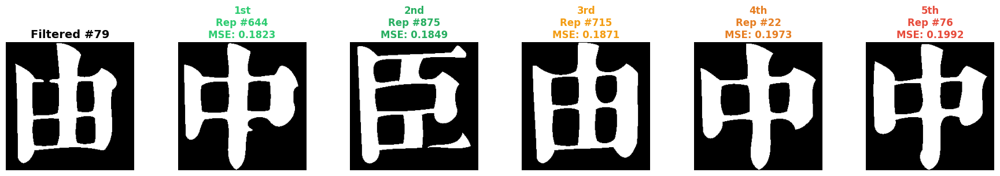


Top 5 representatives for filtered image #79:
  1. Rep #644: MSE = 0.182251
  2. Rep #875: MSE = 0.184875
  3. Rep #715: MSE = 0.187088
  4. Rep #22: MSE = 0.197281
  5. Rep #76: MSE = 0.199158

  MSE spread (5th - 1st): 0.016907
  → CLOSE CALL: Small difference between candidates



Press Enter for image #80, 'q' to quit:  



IMAGE #80 (showing filtered + top 5 reps)


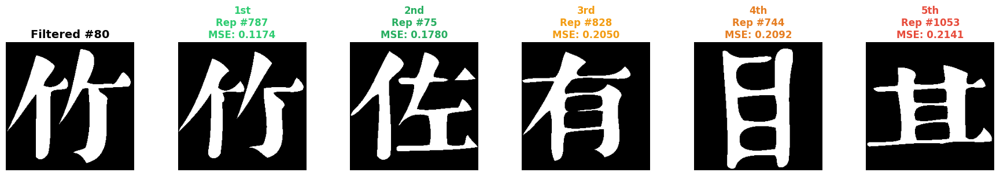


Top 5 representatives for filtered image #80:
  1. Rep #787: MSE = 0.117447
  2. Rep #75: MSE = 0.177963
  3. Rep #828: MSE = 0.204987
  4. Rep #744: MSE = 0.209229
  5. Rep #1053: MSE = 0.214142

  MSE spread (5th - 1st): 0.096695



Press Enter for image #81, 'q' to quit:  



IMAGE #81 (showing filtered + top 5 reps)


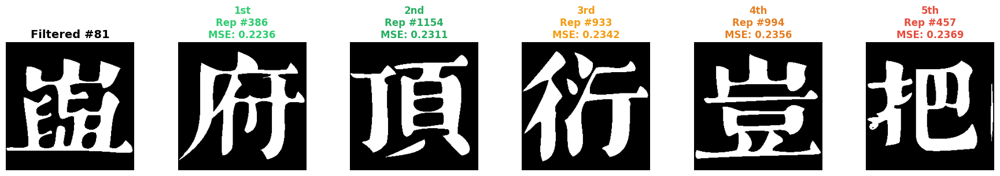


Top 5 representatives for filtered image #81:
  1. Rep #386: MSE = 0.223602
  2. Rep #1154: MSE = 0.231140
  3. Rep #933: MSE = 0.234192
  4. Rep #994: MSE = 0.235580
  5. Rep #457: MSE = 0.236908

  MSE spread (5th - 1st): 0.013306
  → CLOSE CALL: Small difference between candidates



Press Enter for image #82, 'q' to quit:  



IMAGE #82 (showing filtered + top 5 reps)


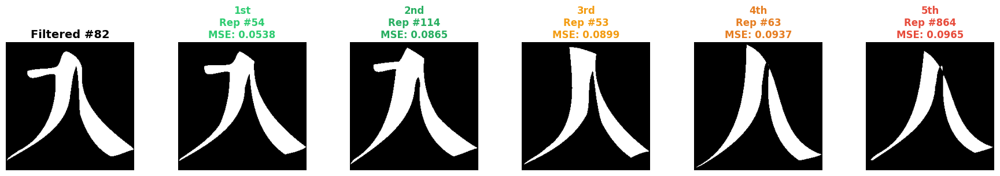


Top 5 representatives for filtered image #82:
  1. Rep #54: MSE = 0.053802
  2. Rep #114: MSE = 0.086456
  3. Rep #53: MSE = 0.089859
  4. Rep #63: MSE = 0.093704
  5. Rep #864: MSE = 0.096466

  MSE spread (5th - 1st): 0.042664



Press Enter for image #83, 'q' to quit:  



IMAGE #83 (showing filtered + top 5 reps)


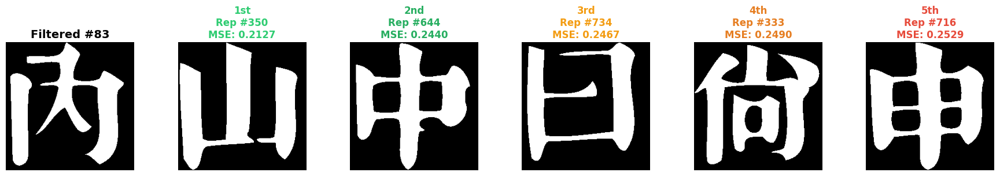


Top 5 representatives for filtered image #83:
  1. Rep #350: MSE = 0.212708
  2. Rep #644: MSE = 0.243988
  3. Rep #734: MSE = 0.246719
  4. Rep #333: MSE = 0.248962
  5. Rep #716: MSE = 0.252884

  MSE spread (5th - 1st): 0.040176



Press Enter for image #84, 'q' to quit:  



IMAGE #84 (showing filtered + top 5 reps)


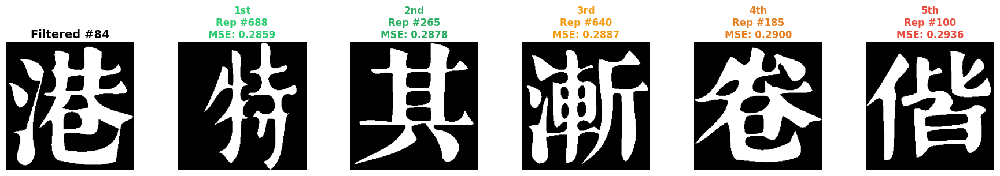


Top 5 representatives for filtered image #84:
  1. Rep #688: MSE = 0.285919
  2. Rep #265: MSE = 0.287781
  3. Rep #640: MSE = 0.288651
  4. Rep #185: MSE = 0.289978
  5. Rep #100: MSE = 0.293640

  MSE spread (5th - 1st): 0.007721
  → CLOSE CALL: Small difference between candidates



Press Enter for image #85, 'q' to quit:  



IMAGE #85 (showing filtered + top 5 reps)


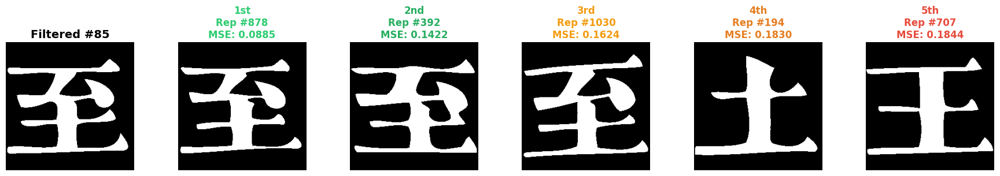


Top 5 representatives for filtered image #85:
  1. Rep #878: MSE = 0.088486
  2. Rep #392: MSE = 0.142212
  3. Rep #1030: MSE = 0.162430
  4. Rep #194: MSE = 0.182999
  5. Rep #707: MSE = 0.184387

  MSE spread (5th - 1st): 0.095901



Press Enter for image #86, 'q' to quit:  



IMAGE #86 (showing filtered + top 5 reps)


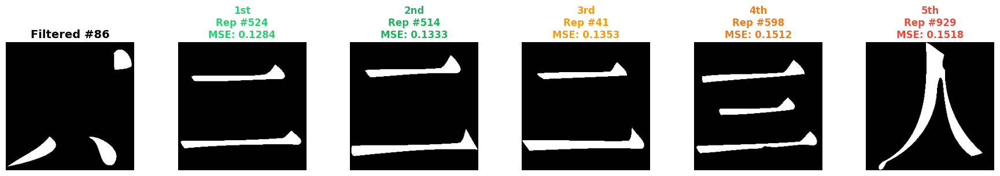


Top 5 representatives for filtered image #86:
  1. Rep #524: MSE = 0.128357
  2. Rep #514: MSE = 0.133270
  3. Rep #41: MSE = 0.135345
  4. Rep #598: MSE = 0.151199
  5. Rep #929: MSE = 0.151810

  MSE spread (5th - 1st): 0.023453



Press Enter for image #87, 'q' to quit:  



IMAGE #87 (showing filtered + top 5 reps)


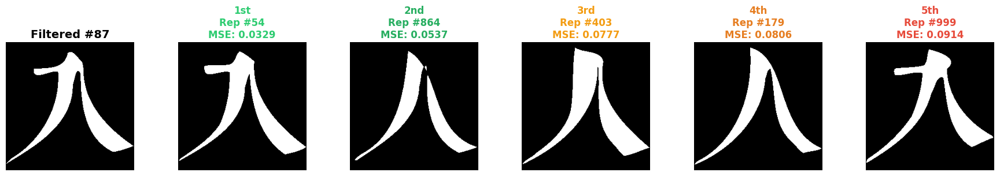


Top 5 representatives for filtered image #87:
  1. Rep #54: MSE = 0.032867
  2. Rep #864: MSE = 0.053711
  3. Rep #403: MSE = 0.077698
  4. Rep #179: MSE = 0.080612
  5. Rep #999: MSE = 0.091415

  MSE spread (5th - 1st): 0.058548



Press Enter for image #88, 'q' to quit:  



IMAGE #88 (showing filtered + top 5 reps)


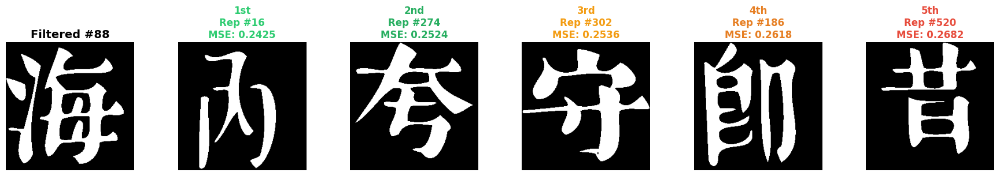


Top 5 representatives for filtered image #88:
  1. Rep #16: MSE = 0.242477
  2. Rep #274: MSE = 0.252380
  3. Rep #302: MSE = 0.253601
  4. Rep #186: MSE = 0.261841
  5. Rep #520: MSE = 0.268219

  MSE spread (5th - 1st): 0.025742



Press Enter for image #89, 'q' to quit:  



IMAGE #89 (showing filtered + top 5 reps)


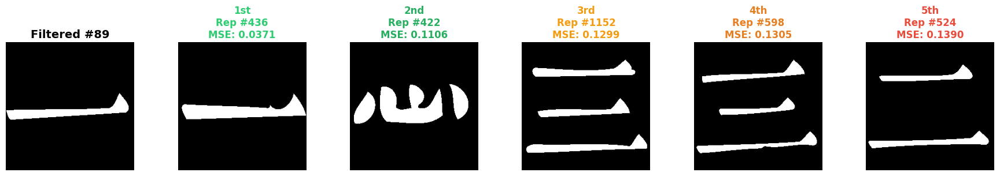


Top 5 representatives for filtered image #89:
  1. Rep #436: MSE = 0.037125
  2. Rep #422: MSE = 0.110626
  3. Rep #1152: MSE = 0.129913
  4. Rep #598: MSE = 0.130539
  5. Rep #524: MSE = 0.138977

  MSE spread (5th - 1st): 0.101852
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #90, 'q' to quit:  



IMAGE #90 (showing filtered + top 5 reps)


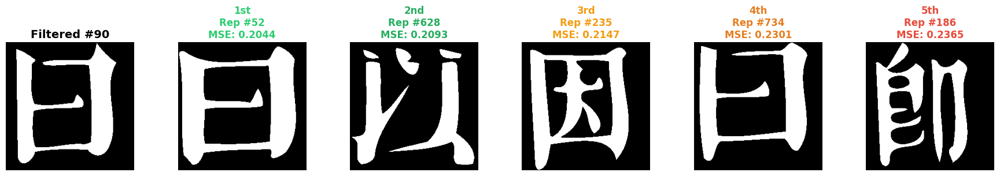


Top 5 representatives for filtered image #90:
  1. Rep #52: MSE = 0.204361
  2. Rep #628: MSE = 0.209290
  3. Rep #235: MSE = 0.214737
  4. Rep #734: MSE = 0.230118
  5. Rep #186: MSE = 0.236450

  MSE spread (5th - 1st): 0.032089



Press Enter for image #91, 'q' to quit:  



IMAGE #91 (showing filtered + top 5 reps)


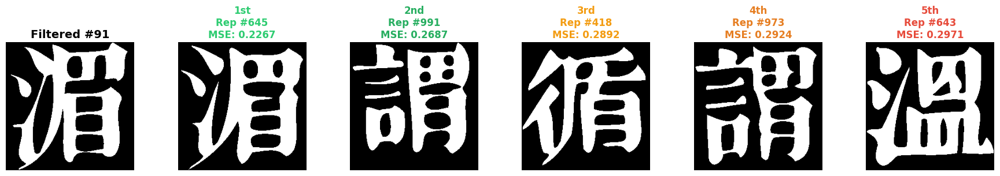


Top 5 representatives for filtered image #91:
  1. Rep #645: MSE = 0.226730
  2. Rep #991: MSE = 0.268738
  3. Rep #418: MSE = 0.289185
  4. Rep #973: MSE = 0.292374
  5. Rep #643: MSE = 0.297150

  MSE spread (5th - 1st): 0.070419



Press Enter for image #92, 'q' to quit:  



IMAGE #92 (showing filtered + top 5 reps)


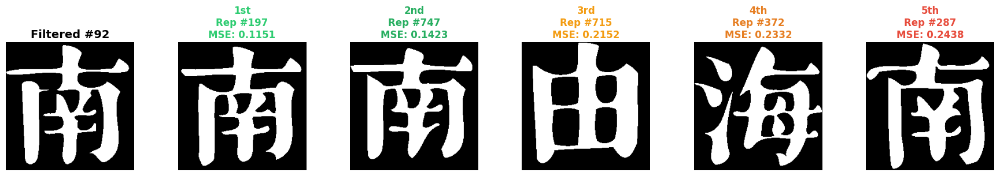


Top 5 representatives for filtered image #92:
  1. Rep #197: MSE = 0.115051
  2. Rep #747: MSE = 0.142334
  3. Rep #715: MSE = 0.215179
  4. Rep #372: MSE = 0.233154
  5. Rep #287: MSE = 0.243774

  MSE spread (5th - 1st): 0.128723
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #93, 'q' to quit:  



IMAGE #93 (showing filtered + top 5 reps)


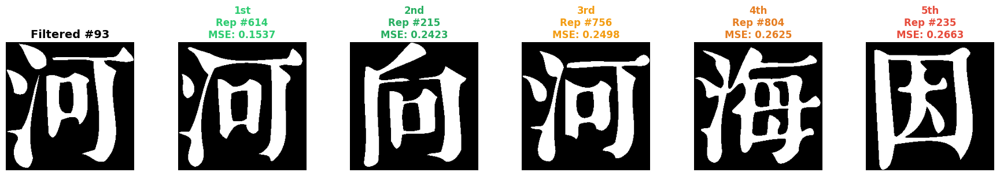


Top 5 representatives for filtered image #93:
  1. Rep #614: MSE = 0.153702
  2. Rep #215: MSE = 0.242294
  3. Rep #756: MSE = 0.249786
  4. Rep #804: MSE = 0.262543
  5. Rep #235: MSE = 0.266342

  MSE spread (5th - 1st): 0.112640
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #94, 'q' to quit:  



IMAGE #94 (showing filtered + top 5 reps)


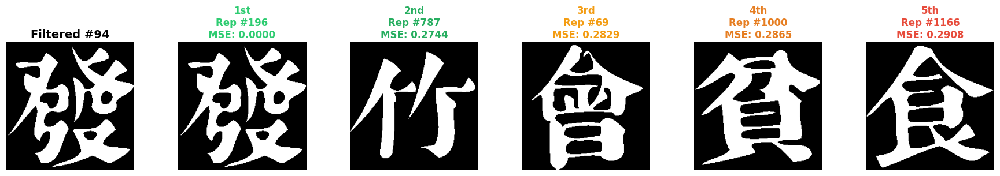


Top 5 representatives for filtered image #94:
  1. Rep #196: MSE = 0.000000
  2. Rep #787: MSE = 0.274368
  3. Rep #69: MSE = 0.282852
  4. Rep #1000: MSE = 0.286469
  5. Rep #1166: MSE = 0.290756

  MSE spread (5th - 1st): 0.290756
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #95, 'q' to quit:  



IMAGE #95 (showing filtered + top 5 reps)


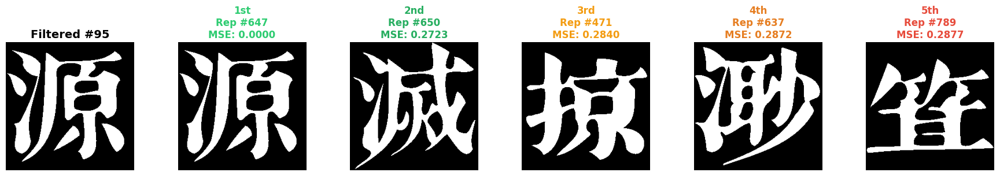


Top 5 representatives for filtered image #95:
  1. Rep #647: MSE = 0.000000
  2. Rep #650: MSE = 0.272339
  3. Rep #471: MSE = 0.284027
  4. Rep #637: MSE = 0.287247
  5. Rep #789: MSE = 0.287674

  MSE spread (5th - 1st): 0.287674
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #96, 'q' to quit:  



IMAGE #96 (showing filtered + top 5 reps)


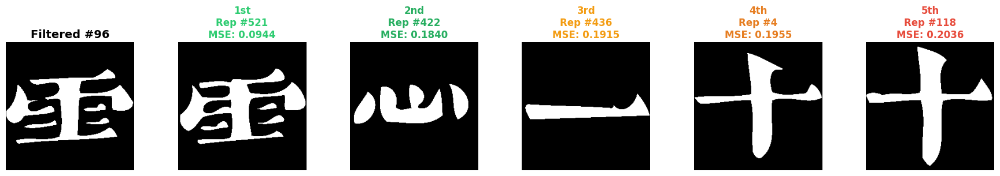


Top 5 representatives for filtered image #96:
  1. Rep #521: MSE = 0.094421
  2. Rep #422: MSE = 0.184006
  3. Rep #436: MSE = 0.191467
  4. Rep #4: MSE = 0.195511
  5. Rep #118: MSE = 0.203644

  MSE spread (5th - 1st): 0.109222
  → CLEAR WINNER: Big gap between 1st and others



Press Enter for image #97, 'q' to quit:  



IMAGE #97 (showing filtered + top 5 reps)


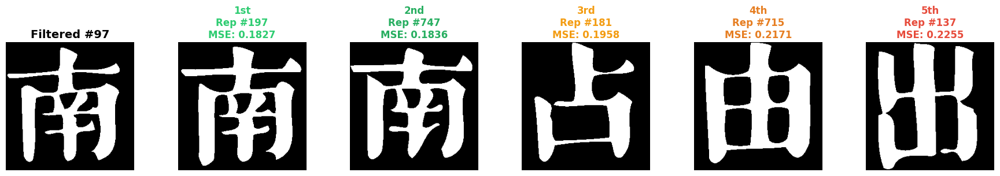


Top 5 representatives for filtered image #97:
  1. Rep #197: MSE = 0.182663
  2. Rep #747: MSE = 0.183609
  3. Rep #181: MSE = 0.195770
  4. Rep #715: MSE = 0.217148
  5. Rep #137: MSE = 0.225479

  MSE spread (5th - 1st): 0.042816



Press Enter for image #98, 'q' to quit:  



IMAGE #98 (showing filtered + top 5 reps)


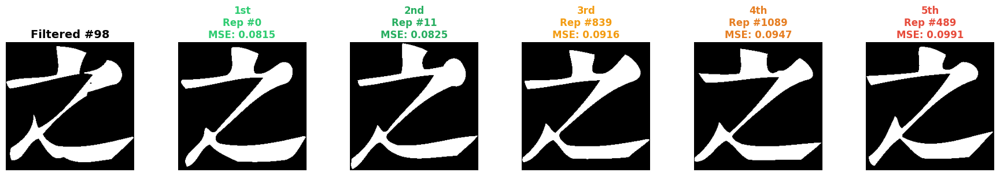


Top 5 representatives for filtered image #98:
  1. Rep #0: MSE = 0.081528
  2. Rep #11: MSE = 0.082458
  3. Rep #839: MSE = 0.091629
  4. Rep #1089: MSE = 0.094742
  5. Rep #489: MSE = 0.099136

  MSE spread (5th - 1st): 0.017609
  → CLOSE CALL: Small difference between candidates



Press Enter for image #99, 'q' to quit:  



IMAGE #99 (showing filtered + top 5 reps)


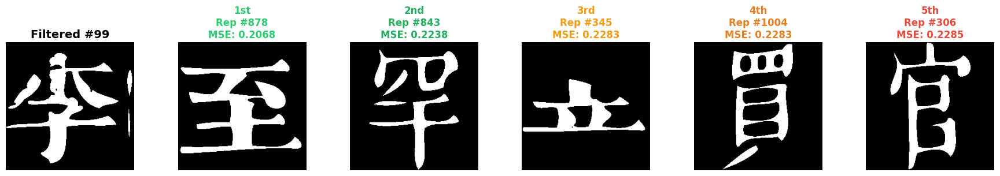


Top 5 representatives for filtered image #99:
  1. Rep #878: MSE = 0.206802
  2. Rep #843: MSE = 0.223801
  3. Rep #345: MSE = 0.228317
  4. Rep #1004: MSE = 0.228333
  5. Rep #306: MSE = 0.228500

  MSE spread (5th - 1st): 0.021698

Reached image #99 (last one)

COMPLETED: Viewed 100 images


In [45]:
def scroll_through_first_100(filtered_tensors, rep_tensors, final_top5, 
                            mse_matrix, start_idx=0, num_images=100):
    """
    Scroll through images one by one, pressing Enter after each.
    Each image shows: Filtered + Top 5 representatives.
    """
    print(f"Scrolling through images {start_idx} to {start_idx + num_images - 1}")
    print("Press Enter to see next image, 'q' to quit")
    print("="*60)
    
    for img_idx in range(start_idx, start_idx + num_images):
        if img_idx >= len(filtered_tensors):
            print(f"Reached end of dataset (only {len(filtered_tensors)} images)")
            break
        
        print(f"\n{'='*60}")
        print(f"IMAGE #{img_idx} (showing filtered + top 5 reps)")
        print('='*60)
        
        # Create visualization for this image
        fig, axes = plt.subplots(1, 6, figsize=(18, 3))
        
        # 1. Filtered image (left)
        filtered_img = filtered_tensors[img_idx].cpu().squeeze().numpy()
        axes[0].imshow(filtered_img, cmap='gray')
        axes[0].set_title(f'Filtered #{img_idx}', fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        # 2. Top 5 representatives
        top_5_indices = final_top5[img_idx]
        mse_values = [mse_matrix[img_idx, idx].item() for idx in top_5_indices]
        
        for i, (rep_idx, mse) in enumerate(zip(top_5_indices, mse_values)):
            rep_img = rep_tensors[rep_idx].cpu().squeeze().numpy()
            axes[i+1].imshow(rep_img, cmap='gray')
            
            # Color code by rank
            colors = ['#2ECC71', '#27AE60', '#F39C12', '#E67E22', '#E74C3C']  # Green→Red
            axes[i+1].patch.set_edgecolor(colors[i])
            axes[i+1].patch.set_linewidth(3)
            
            # Title with rank and MSE
            rank_text = ['1st', '2nd', '3rd', '4th', '5th'][i]
            axes[i+1].set_title(f'{rank_text}\nRep #{rep_idx}\nMSE: {mse:.4f}', 
                               fontsize=12, color=colors[i], fontweight='bold')
            axes[i+1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print detailed info
        print(f"\nTop 5 representatives for filtered image #{img_idx}:")
        for i, (rep_idx, mse) in enumerate(zip(top_5_indices, mse_values)):
            rank = i + 1
            print(f"  {rank}. Rep #{rep_idx}: MSE = {mse:.6f}")
        
        # Calculate spread
        mse_spread = mse_values[-1] - mse_values[0]
        print(f"\n  MSE spread (5th - 1st): {mse_spread:.6f}")
        
        if mse_spread < 0.02:
            print("  → CLOSE CALL: Small difference between candidates")
        elif mse_spread > 0.1:
            print("  → CLEAR WINNER: Big gap between 1st and others")
        
        # Ask to continue
        if img_idx < start_idx + num_images - 1 and img_idx < len(filtered_tensors) - 1:
            response = input(f"\nPress Enter for image #{img_idx+1}, 'q' to quit: ")
            if response.lower() == 'q':
                print(f"\nStopped at image #{img_idx}")
                break
        else:
            print(f"\nReached image #{img_idx} (last one)")
    
    print(f"\n{'='*60}")
    print(f"COMPLETED: Viewed {min(num_images, len(filtered_tensors))} images")
    print('='*60)

# Run it!
scroll_through_first_100(
    filtered_tensors=filtered_tensors,
    rep_tensors=rep_tensors,
    final_top5=candidates_5_method1,  # Your Method 1 results
    mse_matrix=mse_matrix,
    start_idx=0,      # Start from image 0
    num_images=100    # Show 100 images
)

In [69]:
import numpy as np
import torch
from skimage.metrics import hausdorff_distance
import matplotlib.pyplot as plt

def validate_with_skimage(filtered_tensors, rep_tensors, test_results, 
                         num_to_validate=10):
    """
    Validate Hausdorff results using skimage's official implementation.
    """
    device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
    
    print("="*70)
    print("SKIMAGE HAUSDORFF VALIDATION")
    print("="*70)
    print(f"Validating {num_to_validate} matches using skimage.metrics.hausdorff_distance")
    
    # Initialize warping
    from src.registration.single_scale import InverseCompositional
    from src.registration.gradients import Gradients
    
    gradient_method = Gradients(method='farid5', C=1, device=device)
    ic = InverseCompositional(
        transform_type='homography',
        gradient_method=gradient_method,
        error_function='l2',
        delta=5,
        epsilon=1e-3,
        max_iter=30,
    )
    
    # Move data
    filtered_tensors = filtered_tensors.to(device)
    rep_tensors = rep_tensors.to(device)
    
    comparison = []
    
    for i in range(min(num_to_validate, len(test_results))):
        rep_idx = int(test_results[i, 0])
        our_distance = test_results[i, 1]
        
        print(f"\nImage {i}: Our distance = {our_distance:.4f}")
        print(f"  Matching with Rep #{rep_idx}")
        
        try:
            # Warp the image
            rep_img = rep_tensors[rep_idx:rep_idx+1]
            filter_img = filtered_tensors[i:i+1]
            
            T = ic.run(I1=rep_img, I2=filter_img)
            warped = T.warp(filter_img)
            mask = T.visibility_mask(256, 256, delta=0)
            warped[0, 0][~mask] = 0
            
            # Convert to binary numpy arrays for skimage
            warped_bin = (warped.squeeze().cpu().numpy() > 0.5).astype(np.uint8)
            rep_bin = (rep_img.squeeze().cpu().numpy() > 0.5).astype(np.uint8)
            
            # Get coordinates of ink pixels
            warped_coords = np.column_stack(np.where(warped_bin))
            rep_coords = np.column_stack(np.where(rep_bin))
            
            if len(warped_coords) == 0 or len(rep_coords) == 0:
                print(f"  ⚠️  Empty image - cannot compute Hausdorff")
                skimage_distance = float('inf')
            else:
                # Compute skimage Hausdorff distance
                skimage_distance = hausdorff_distance(warped_coords, rep_coords)
            
            # Compare
            difference = abs(our_distance - skimage_distance)
            relative_diff = difference / skimage_distance if skimage_distance > 0 else 0
            
            comparison.append({
                'image_idx': i,
                'rep_idx': rep_idx,
                'our_distance': our_distance,
                'skimage_distance': skimage_distance,
                'difference': difference,
                'relative_diff': relative_diff
            })
            
            print(f"  skimage Hausdorff = {skimage_distance:.4f}")
            print(f"  Difference = {difference:.4f} ({relative_diff*100:.1f}%)")
            
            if relative_diff < 0.1:  # Within 10%
                print(f"  ✅ GOOD agreement!")
            elif relative_diff < 0.3:  # Within 30%
                print(f"  ⚠️  Fair agreement")
            else:
                print(f"  ❌ Poor agreement")
            
            # Visualize for problematic cases
            if relative_diff > 0.3 or difference > 5.0:
                print(f"  🔍 Visualizing problematic case...")
                
                fig, axes = plt.subplots(2, 3, figsize=(12, 8))
                
                # Original images
                axes[0, 0].imshow(filter_img.squeeze().cpu().numpy(), cmap='gray')
                axes[0, 0].set_title(f'Filtered #{i}')
                axes[0, 0].axis('off')
                
                axes[0, 1].imshow(rep_img.squeeze().cpu().numpy(), cmap='gray')
                axes[0, 1].set_title(f'Rep #{rep_idx}')
                axes[0, 1].axis('off')
                
                axes[0, 2].imshow(warped_bin, cmap='gray')
                axes[0, 2].set_title(f'Warped (binary)')
                axes[0, 2].axis('off')
                
                # Overlay
                axes[1, 0].imshow(rep_bin, cmap='gray', alpha=0.5)
                axes[1, 0].imshow(warped_bin, cmap='hot', alpha=0.5)
                axes[1, 0].set_title('Overlay: Rep(gray) vs Warped(hot)')
                axes[1, 0].axis('off')
                
                # Scatter plot of coordinates
                axes[1, 1].scatter(rep_coords[:, 1], rep_coords[:, 0], 
                                  s=1, c='blue', alpha=0.5, label='Rep')
                axes[1, 1].scatter(warped_coords[:, 1], warped_coords[:, 0], 
                                  s=1, c='red', alpha=0.5, label='Warped')
                axes[1, 1].invert_yaxis()
                axes[1, 1].set_title('Ink pixel coordinates')
                axes[1, 1].legend(loc='upper right')
                axes[1, 1].axis('off')
                
                # Distance histogram
                if len(warped_coords) * len(rep_coords) < 1000000:  # If not too many
                    # Compute some sample distances
                    sample_size = min(1000, len(warped_coords), len(rep_coords))
                    sample_warped = warped_coords[np.random.choice(len(warped_coords), sample_size)]
                    sample_rep = rep_coords[np.random.choice(len(rep_coords), sample_size)]
                    
                    distances = []
                    for coord in sample_warped:
                        dists = np.sqrt(((sample_rep - coord) ** 2).sum(axis=1))
                        distances.append(dists.min())
                    
                    axes[1, 2].hist(distances, bins=50, alpha=0.7)
                    axes[1, 2].axvline(x=skimage_distance, color='red', linestyle='--', 
                                       label=f'Hausdorff = {skimage_distance:.2f}')
                    axes[1, 2].set_title('Min distances distribution')
                    axes[1, 2].set_xlabel('Distance (pixels)')
                    axes[1, 2].set_ylabel('Frequency')
                    axes[1, 2].legend()
                
                plt.suptitle(f'Image {i}: Our HD={our_distance:.2f}, skimage HD={skimage_distance:.2f}')
                plt.tight_layout()
                plt.show()
                
        except Exception as e:
            print(f"  ❌ Validation failed: {e}")
            comparison.append({
                'image_idx': i,
                'error': str(e)
            })
    
    # Summary statistics
    print("\n" + "="*70)
    print("VALIDATION SUMMARY")
    print("="*70)
    
    valid_comparisons = [c for c in comparison if 'skimage_distance' in c]
    
    if valid_comparisons:
        differences = [c['difference'] for c in valid_comparisons]
        relative_diffs = [c['relative_diff'] for c in valid_comparisons if c['skimage_distance'] > 0]
        
        print(f"Valid comparisons: {len(valid_comparisons)}/{num_to_validate}")
        print(f"\nDifference statistics (absolute):")
        print(f"  Mean difference: {np.mean(differences):.4f} pixels")
        print(f"  Max difference: {np.max(differences):.4f} pixels")
        print(f"  Min difference: {np.min(differences):.4f} pixels")
        
        if relative_diffs:
            print(f"\nDifference statistics (relative):")
            print(f"  Mean relative difference: {np.mean(relative_diffs)*100:.1f}%")
            print(f"  Max relative difference: {np.max(relative_diffs)*100:.1f}%")
        
        # Agreement analysis
        good_agreement = sum(1 for c in valid_comparisons 
                           if c.get('relative_diff', 1) < 0.1)
        fair_agreement = sum(1 for c in valid_comparisons 
                           if 0.1 <= c.get('relative_diff', 1) < 0.3)
        poor_agreement = sum(1 for c in valid_comparisons 
                           if c.get('relative_diff', 1) >= 0.3)
        
        print(f"\nAgreement levels:")
        print(f"  Good (<10% diff): {good_agreement}/{len(valid_comparisons)}")
        print(f"  Fair (10-30% diff): {fair_agreement}/{len(valid_comparisons)}")
        print(f"  Poor (>30% diff): {poor_agreement}/{len(valid_comparisons)}")
        
        # Scatter plot comparison
        if len(valid_comparisons) >= 3:
            fig, ax = plt.subplots(figsize=(8, 6))
            
            our_values = [c['our_distance'] for c in valid_comparisons]
            skimage_values = [c['skimage_distance'] for c in valid_comparisons]
            
            ax.scatter(our_values, skimage_values, alpha=0.7)
            
            # Perfect agreement line
            max_val = max(max(our_values), max(skimage_values))
            ax.plot([0, max_val], [0, max_val], 'r--', alpha=0.5, label='Perfect agreement')
            
            ax.set_xlabel('Our Hausdorff distance')
            ax.set_ylabel('skimage Hausdorff distance')
            ax.set_title('Hausdorff Distance Comparison')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
        
        # Recommendation
        print(f"\n" + "="*70)
        print("RECOMMENDATION")
        print("="*70)
        
        if good_agreement >= len(valid_comparisons) * 0.8:
            print("✅ EXCELLENT: Our implementation matches skimage well!")
            print("   You can trust your pipeline results.")
        elif good_agreement + fair_agreement >= len(valid_comparisons) * 0.8:
            print("⚠️  ACCEPTABLE: Some differences but generally consistent.")
            print("   Your pipeline is usable but consider using skimage for final results.")
        else:
            print("❌ PROBLEMATIC: Significant differences from skimage.")
            print("   Consider using skimage implementation directly.")
    
    return comparison


In [66]:
def fixed_memory_pipeline_corrected(filtered_tensors, rep_tensors, top5_candidates_path,
                                   device='mps', save_dir="memory_safe_results"):
    """
    CORRECTED pipeline with PROPER Hausdorff distance.
    """
    device = torch.device(device if torch.backends.mps.is_available() else 'cpu')
    
    # Load candidates
    top5_candidates = np.load(top5_candidates_path)
    Nf = len(filtered_tensors)
    
    print("="*70)
    print("CORRECTED PIPELINE WITH KD-TREE HAUSDORFF")
    print("="*70)
    print(f"Device: {device}")
    
    # Initialize warping
    from src.registration.single_scale import InverseCompositional
    from src.registration.gradients import Gradients
    
    gradient_method = Gradients(method='farid5', C=1, device=device)
    ic = InverseCompositional(
        transform_type='homography',
        gradient_method=gradient_method,
        error_function='l2',
        delta=5,
        epsilon=1e-3,
        max_iter=30,
    )
    
    # Move data
    filtered_tensors = filtered_tensors.to(device)
    rep_tensors = rep_tensors.to(device)
    
    # CORRECT Hausdorff function
    def compute_hausdorff(img1_bin, img2_bin):
        """
        Proper Hausdorff distance using KD-tree.
        """
        # Get coordinates
        coords1 = torch.nonzero(img1_bin, as_tuple=False).float()
        coords2 = torch.nonzero(img2_bin, as_tuple=False).float()
        
        if len(coords1) == 0 or len(coords2) == 0:
            return float('inf')
        
        # Convert to numpy for KD-tree (scipy doesn't work with torch)
        coords1_np = coords1.cpu().numpy()
        coords2_np = coords2.cpu().numpy()
        
        from scipy.spatial import cKDTree
        
        tree1 = cKDTree(coords1_np)
        tree2 = cKDTree(coords2_np)
        
        # Query nearest neighbors
        dist1, _ = tree2.query(coords1_np, workers=-1)
        dist2, _ = tree1.query(coords2_np, workers=-1)
        
        return float(max(dist1.max(), dist2.max()))
    
    # Results
    final_matches = np.zeros((Nf, 2))
    
    # Process
    for i in tqdm(range(Nf), desc="Processing"):
        candidates = top5_candidates[i]
        best_dist = float('inf')
        best_j = -1
        
        for j in candidates:
            try:
                # Warp
                rep_img = rep_tensors[j:j+1]
                filter_img = filtered_tensors[i:i+1]
                
                T = ic.run(I1=rep_img, I2=filter_img)
                warped = T.warp(filter_img)
                mask = T.visibility_mask(256, 256, delta=0)
                warped[0, 0][~mask] = 0
                
                # Convert to binary
                warped_bin = warped.squeeze() > 0.5
                rep_bin = rep_img.squeeze() > 0.5
                
                # ✅ CORRECT: Use KD-tree Hausdorff
                dist = compute_hausdorff(warped_bin, rep_bin)
                
            except Exception as e:
                print(f"Error for image {i}, rep {j}: {e}")
                dist = float('inf')
            
            if dist < best_dist:
                best_dist = dist
                best_j = j
        
        # Store
        final_matches[i] = [float(best_j), float(best_dist)]
    
    # Save
    os.makedirs(save_dir, exist_ok=True)
    np.save(os.path.join(save_dir, "final_matches.npy"), final_matches)
    
    # Statistics
    valid_dists = final_matches[:, 1][final_matches[:, 1] < float('inf')]
    
    print(f"\n✅ Complete! Processed {Nf} images")
    if len(valid_dists) > 0:
        print(f"Hausdorff distance statistics:")
        print(f"  Min: {valid_dists.min():.2f} pixels")
        print(f"  Max: {valid_dists.max():.2f} pixels")
        print(f"  Mean: {valid_dists.mean():.2f} pixels")
        print(f"  Median: {np.median(valid_dists):.2f} pixels")
    
    return final_matches

In [67]:
# Quick test to verify
def test_kdtree_vs_cdist():
    """Compare KD-tree vs torch.cdist for correctness"""
    import numpy as np
    from scipy.spatial import cKDTree
    
    # Create test data
    np.random.seed(42)
    n1, n2 = 1000, 1000  # Smaller for testing
    coords1 = np.random.rand(n1, 2) * 100
    coords2 = np.random.rand(n2, 2) * 100
    
    # Method 1: KD-tree (skimage way)
    tree1 = cKDTree(coords1)
    tree2 = cKDTree(coords2)
    dist1_kd, _ = tree2.query(coords1)
    dist2_kd, _ = tree1.query(coords2)
    hd_kd = max(dist1_kd.max(), dist2_kd.max())
    
    # Method 2: Full distance matrix (torch.cdist way)
    coords1_t = torch.tensor(coords1)
    coords2_t = torch.tensor(coords2)
    distances = torch.cdist(coords1_t, coords2_t, p=2)
    min1 = distances.min(dim=1)[0].max()
    min2 = distances.min(dim=0)[0].max()
    hd_cdist = max(min1.item(), min2.item())
    
    print(f"KD-tree Hausdorff: {hd_kd:.6f}")
    print(f"torch.cdist Hausdorff: {hd_cdist:.6f}")
    print(f"Difference: {abs(hd_kd - hd_cdist):.6f}")
    print(f"Match? {abs(hd_kd - hd_cdist) < 1e-6}")
    
    return abs(hd_kd - hd_cdist) < 1e-6

# Run test
test_kdtree_vs_cdist()

KD-tree Hausdorff: 5.435916
torch.cdist Hausdorff: 5.435916
Difference: 0.000000
Match? True


np.True_

Running CORRECTED pipeline...
CORRECTED PIPELINE WITH KD-TREE HAUSDORFF
Device: mps


Processing: 100%|███████████████████████████████| 20/20 [00:33<00:00,  1.65s/it]



✅ Complete! Processed 20 images
Hausdorff distance statistics:
  Min: 0.00 pixels
  Max: 36.00 pixels
  Mean: 13.17 pixels
  Median: 12.47 pixels
Validating with skimage...
SKIMAGE HAUSDORFF VALIDATION
Validating 10 matches using skimage.metrics.hausdorff_distance

Image 0: Our distance = 25.0000
  Matching with Rep #542
  skimage Hausdorff = 3518.0000
  Difference = 3493.0000 (99.3%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


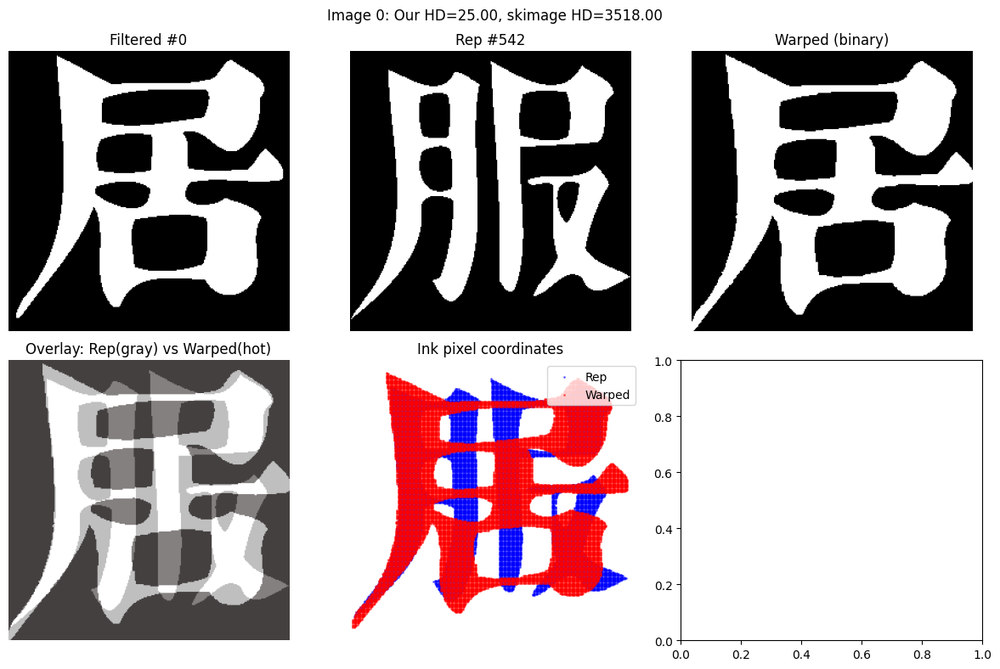


Image 1: Our distance = 12.7279
  Matching with Rep #736
  skimage Hausdorff = 630.0000
  Difference = 617.2721 (98.0%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


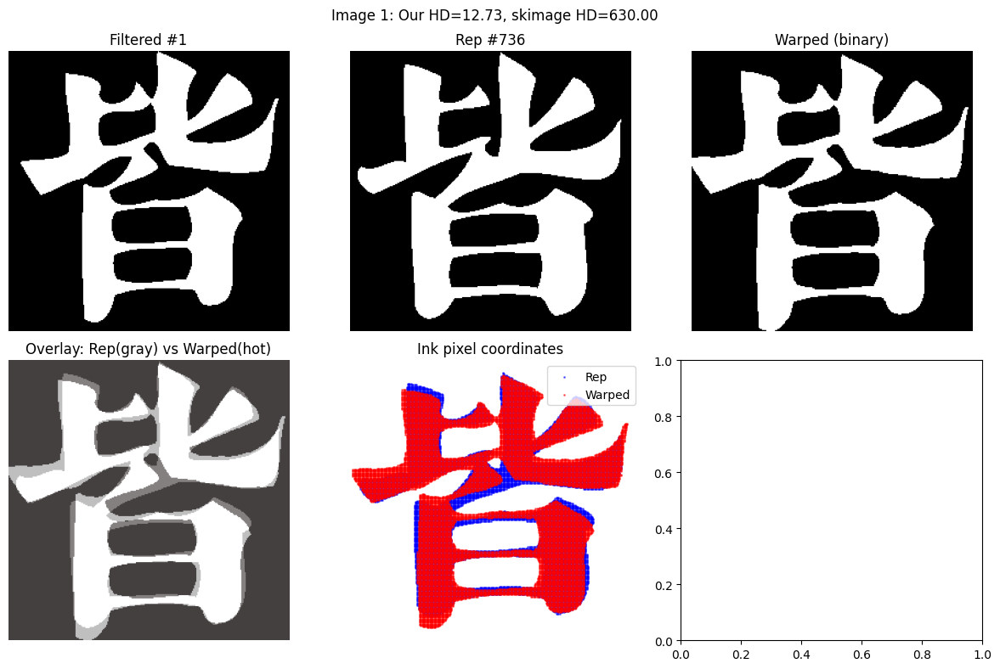


Image 2: Our distance = 0.0000
  Matching with Rep #565
  skimage Hausdorff = 0.0000
  Difference = 0.0000 (0.0%)
  ✅ GOOD agreement!

Image 3: Our distance = 0.0000
  Matching with Rep #344
  skimage Hausdorff = 0.0000
  Difference = 0.0000 (0.0%)
  ✅ GOOD agreement!

Image 4: Our distance = 18.0000
  Matching with Rep #610
  skimage Hausdorff = 2168.0000
  Difference = 2150.0000 (99.2%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


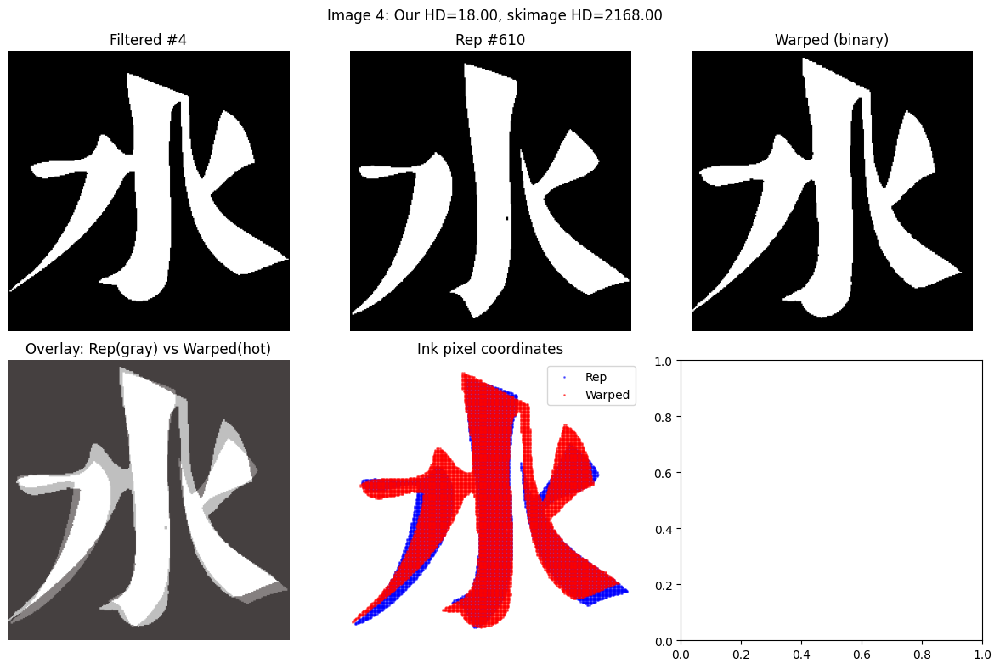


Image 5: Our distance = 12.2066
  Matching with Rep #541
  skimage Hausdorff = 1165.0000
  Difference = 1152.7934 (99.0%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


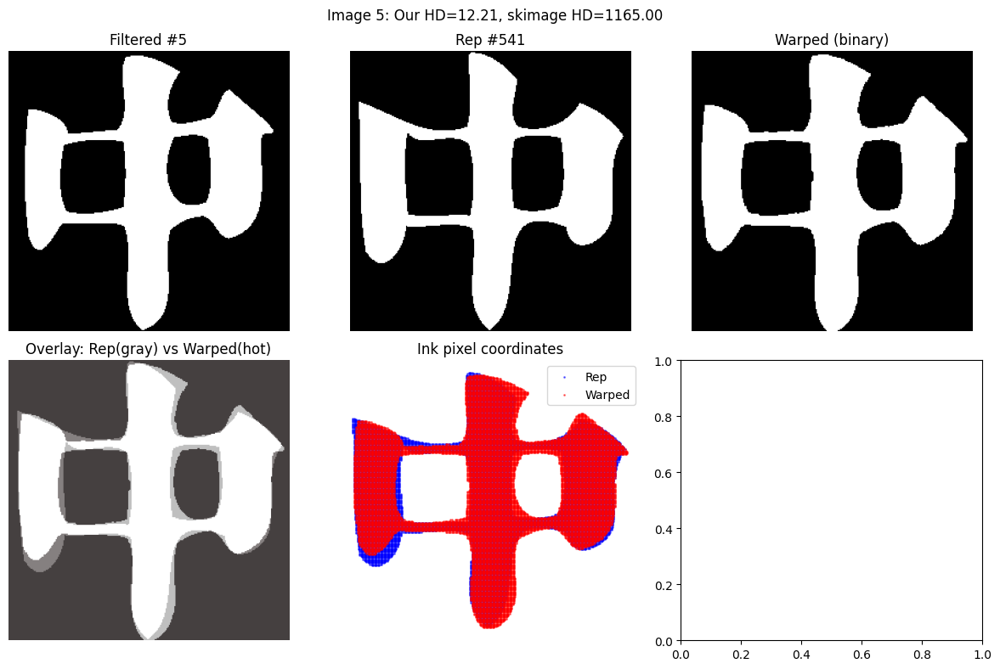


Image 6: Our distance = 23.0217
  Matching with Rep #901
  skimage Hausdorff = 1280.0000
  Difference = 1256.9783 (98.2%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


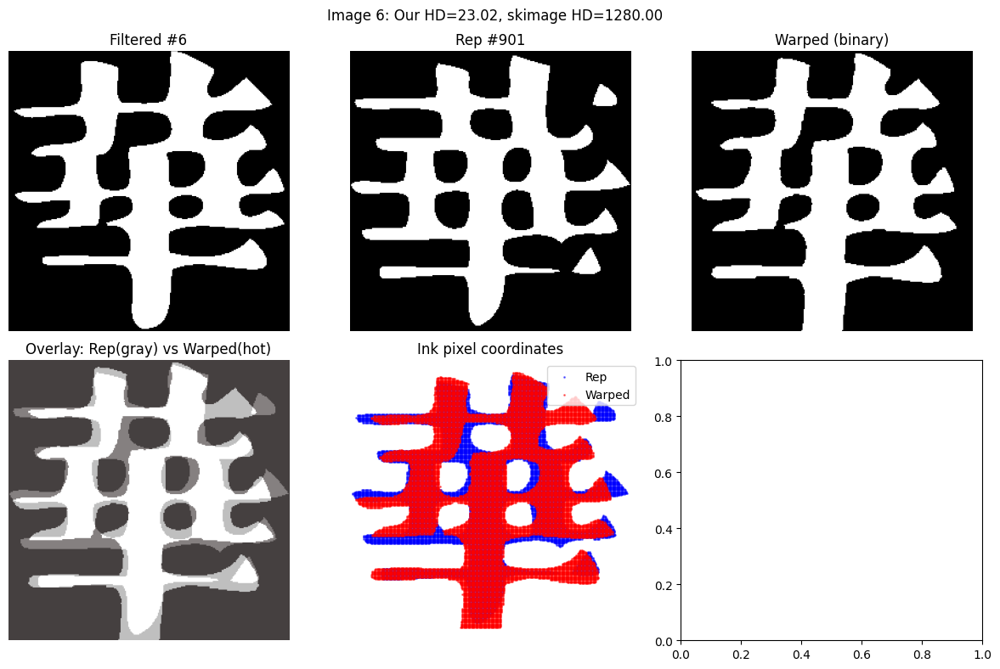


Image 7: Our distance = 0.0000
  Matching with Rep #577
  skimage Hausdorff = 0.0000
  Difference = 0.0000 (0.0%)
  ✅ GOOD agreement!

Image 8: Our distance = 0.0000
  Matching with Rep #705
  skimage Hausdorff = 0.0000
  Difference = 0.0000 (0.0%)
  ✅ GOOD agreement!

Image 9: Our distance = 19.1050
  Matching with Rep #344
  skimage Hausdorff = 3075.0000
  Difference = 3055.8950 (99.4%)
  ❌ Poor agreement
  🔍 Visualizing problematic case...


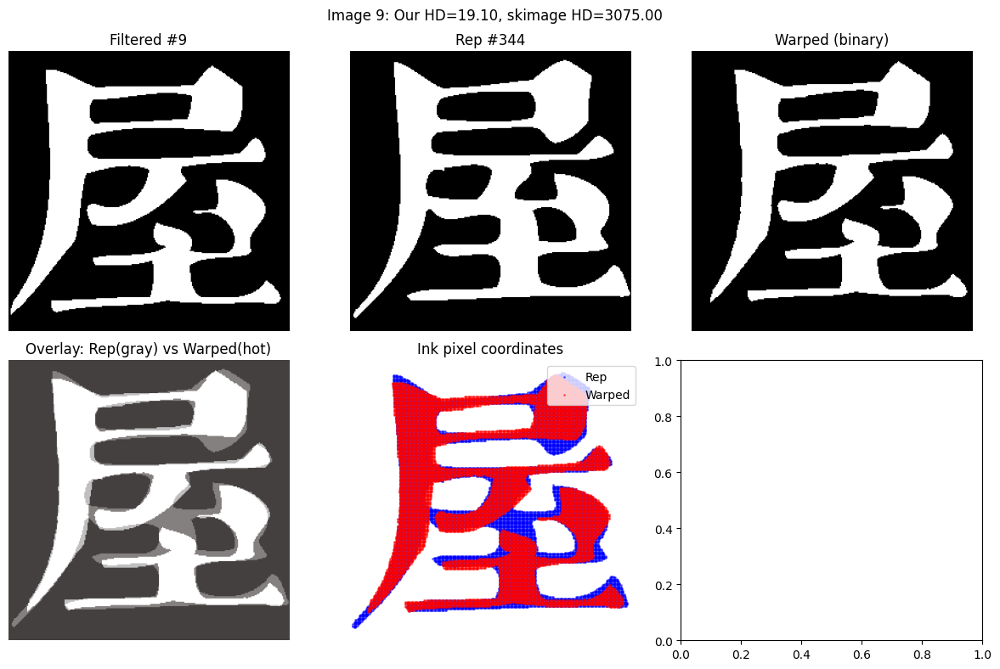


VALIDATION SUMMARY
Valid comparisons: 10/10

Difference statistics (absolute):
  Mean difference: 1172.5939 pixels
  Max difference: 3493.0000 pixels
  Min difference: 0.0000 pixels

Difference statistics (relative):
  Mean relative difference: 98.8%
  Max relative difference: 99.4%

Agreement levels:
  Good (<10% diff): 4/10
  Fair (10-30% diff): 0/10
  Poor (>30% diff): 6/10


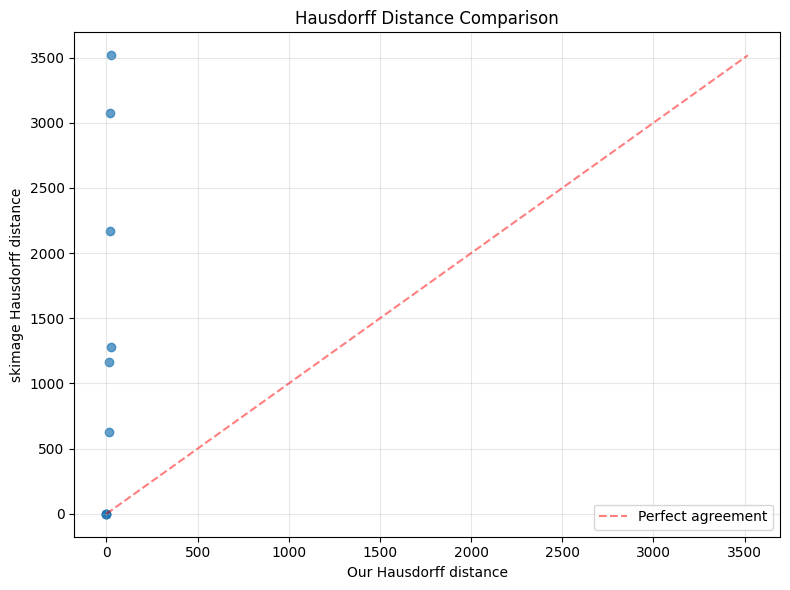


RECOMMENDATION
❌ PROBLEMATIC: Significant differences from skimage.
   Consider using skimage implementation directly.


In [68]:
print("Running CORRECTED pipeline...")
test_results_corrected = fixed_memory_pipeline_corrected(
    filtered_tensors=filtered_tensors[:20],
    rep_tensors=rep_tensors,
    top5_candidates_path="filtering_validation/candidates_5_method1.npy",
    device='mps',
    save_dir="test_corrected_kdtree"
)

print("Validating with skimage...")
validation_results = validate_with_skimage(
    filtered_tensors=filtered_tensors[:20],
    rep_tensors=rep_tensors,
    test_results=test_results_corrected,
    num_to_validate=10
)